# Practical Machine Learning for Physicists
# Coursework D
# Archie Wilson, Student Number: 22008424

In this notebook you will be trying to predict a system using incomplete information. We will set up the equations of motions for a simple double pendulum (or should that be a double simple pendulum. Then we will see if a machine learning technique can predict the future position of the lower mass, using only the lower mass positions.

### Kinematics of the double pendulum
Let's specify our problem in terms of the following, with the origin at the pivot point of the top pendulum. This is just background for the machine learning tasks at the bottom of the notebook.

#### Positions
$$x_1 = L_1 \sin \theta_1$$
$$y_1 = -L_1 \cos \theta_1$$
$$x_2 = x_1 + L_2 \sin \theta_2$$
$$y_2 = y_1 - L_2 \cos \theta_2$$

#### Velocities
$$\dot{x}_1 = \dot{\theta_1} L_1 \cos \theta_1$$
$$\dot{y_1} =  \dot{\theta_1} L_1 \sin \theta_1$$
$$\dot{x_2} = \dot{x_1} + \dot{\theta_2} L_2 \cos \theta_2$$
$$\dot{y_2} = \dot{y_1} + \dot{\theta_2} L_2 \sin \theta_2$$


#### Accelerations

$$\ddot{x}_1 = -\dot{\theta_1}^2 L_1 \sin \theta_1 + \ddot{\theta_1} L_1 \cos \theta_1$$
$$\ddot{y_1} =  \dot{\theta_1}^2 L_1 \cos \theta_1 + \ddot{\theta_1} L_1 \sin \theta_1$$
$$\ddot{x_2} = \ddot{x_1} - \dot{\theta_2}^2 L_2 \sin \theta_2 + \ddot{\theta_2} L_2 \cos \theta_2$$
$$\ddot{y_2} = \ddot{y_1} + \dot{\theta_2}^2 L_2 \cos \theta_2 + \ddot{\theta_2} L_2 \sin \theta_2$$

#### Energies
Let $v_1^2 = \dot{x_1}^2 +\dot{y_1}^2$ and $v_2^2 = \dot{x_2}^2 +\dot{y_2}^2$ then the kinetic energies $T_1$ and $T_2$ are
$$ T_1 = \frac{1}{2}m_1 v_1^2 = \frac{1}{2}m_1 L_1^2 \dot{\theta_1}^2 $$
$$ T_2 = \frac{1}{2}m_2 v_2^2 = \frac{1}{2}m_2 \left( L_1^2 \dot{\theta_1}^2 + L_2^2 \dot{\theta_2}^2 + 2L_1 L_2 \cos(\theta_1-\theta_2) \dot{\theta_1} \dot{\theta_2} \right) $$

The potential enrgies are
$$V_1 = m_1 g y_1 = - m_1 g L_1 \cos \theta_1$$
$$V_2 = m_2 g y_2 = -m_2 g ( L_1 \cos \theta_1 + L_2 \cos \theta_2)$$

#### Langrangian
Now we form the Lagrangian $L=T-V=T_1+T_2 -V_1 -V_2$ and use the Euler-Lagrange equations:
$$\frac{\partial L}{\partial \theta_1} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_1}}$$
$$\frac{\partial L}{\partial \theta_2} = \frac{d}{dt}\frac{\partial L}{\partial \dot{\theta_2}}$$

Applying these gives
$$-(m_1+m_2) g L_1 \sin \theta_1 = (m_1+m_2) L_1^2 \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_2}^2 +  m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_2} $$
and
$$ -m_2 g L_2 \sin \theta_2 = m_2 L_2 \ddot{\theta_2} + m_2 L_1 L_2 \cos(\theta_1-\theta_2) \ddot{\theta_1} + m_2 L_1 L_2 \sin(\theta_1-\theta_2) \dot{\theta_1}^2 $$


#### Equations of motions
$$ \omega_1 = \dot{\theta_1}$$  

$$ \omega_2 = \dot{\theta_2}$$
$$ \ddot\theta_1 = \frac{1}{L_1\xi}\left[L_1m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_1^2 + L_2m_2\sin(\theta_1-\theta_2)\omega_2^2 - m_2g\cos(\theta_1-\theta_2)\sin(\theta_2) + (m_1+m_2)g\sin(\theta_1) \right] $$
$$ \ddot\theta_2 = \frac{1}{L_2\xi}\left[L_2m_2\cos(\theta_1-\theta_2)\sin(\theta_1-\theta_2)\omega_2^2 + L_1(m_1+m_2)\sin(\theta_1-\theta_2)\omega_1^2+(m_1+m_2)g\sin(\theta_1)\cos(\theta_1-\theta_2) - (m_1+m_2)g\sin(\theta_2) \right] $$
where
$$\xi \equiv \cos^2(\theta_1-\theta_2)m_2-m_1-m_2$$


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

import matplotlib.style #Some style nonsense
import matplotlib as mpl #Some more style nonsense

#Set default figure size
#mpl.rcParams['figure.figsize'] = [12.0, 8.0] #Inches... of course it is inches
mpl.rcParams["legend.frameon"] = False
mpl.rcParams['figure.dpi']=200 # dots per inch

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split

In [ ]:
def rhs(t, z, L1, L2, m1, m2, g):
    """
    Returns the right-hand side of the ordinary differential equation describing the double pendulem
    """
    theta1, w1, theta2, w2 = z    #The four components
    cos12 = np.cos(theta1 - theta2)
    sin12 = np.sin(theta1 - theta2)
    sin1 = np.sin(theta1)
    sin2 = np.sin(theta2)
    xi = cos12**2*m2 - m1 - m2
    w1dot = ( L1*m2*cos12*sin12*w1**2 + L2*m2*sin12*w2**2
            - m2*g*cos12*sin2      + (m1 + m2)*g*sin1)/(L1*xi)
    w2dot = -( L2*m2*cos12*sin12*w2**2 + L1*(m1 + m2)*sin12*w1**2
            + (m1 + m2)*g*sin1*cos12  - (m1 + m2)*g*sin2 )/(L2*xi)
    return w1, w1dot, w2, w2dot   #Return the w's and the wdot's


def to_cartesian(theta1, w1, theta2, w2, L1, L2):
    """ Transforms theta and omega to cartesian coordinates
    and velocities x1, y1, x2, y2, vx1, vy1, vx2, vy2
    """
    x1 = L1 * np.sin(theta1)
    y1 = -L1 * np.cos(theta1)
    x2 = x1 + L2 * np.sin(theta2)
    y2 = y1 - L2 * np.cos(theta2)
    vx1 = L1*np.cos(theta1)*w1
    vy1 = L1*np.sin(theta1)*w1
    vx2 = vx1 + L2*np.cos(theta2)*w2
    vy2 = vy1 + L2*np.sin(theta2)*w2
    return x1, y1, x2, y2, vx1, vy1, vx2, vy2


In [ ]:
# Set up the initial conditions. Here we have lengths and masses
L1, L2 = 1., 1.
m1, m2 = 3., 1.
g = 9.81     # [m/s^2]. Gravitational acceleration

#Starting angles
z0=[np.pi/4,0,np.pi/4,0]
#z0=[0.1,0,0.1,0]

#Time ranges
tmax, dt = 50, 0.1
t = np.arange(0, tmax+dt, dt)

In [ ]:
# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

(4, 501)


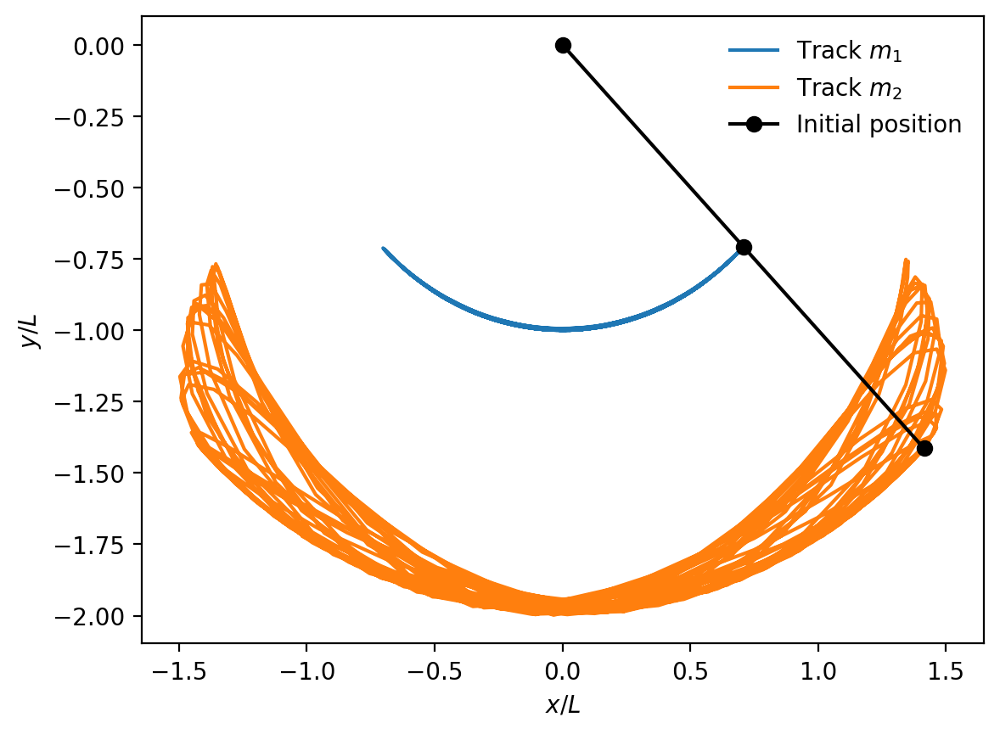

In [ ]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

# Exercises: Predicting Chaos
1. Design and train a recurrent neural network (of your choice) to predict the future positions, where future is defined as $t=t_0 + 20 \delta t$, of the masses $m_1$ and $m_2$ using their cartesian coordinates and the initial conditions  $z_0=[\pi/4,0,\pi/4,0]$.
2. How stable is your network to variations in initial conditions? Make a plot of $x$ and $y$ vs time to show the network prediction in comparison to the solution from solve_ivp
3. How far into the future can a network predict? Make a plot showing how the deviation between predicted position and actual position (from solve_ivp above) vary as a function of extrapolation time from $t=t_0 + 20 \delta t$ to $t=t_0 + 100 \delta t$  (e.g. for each extrapolation time, train a new version of the network and then plot the performance)
4. Repeat steps 1-3 for the initial conditions $z_0=[\pi/2,0,\pi/2,0]$ which give a much more complex path.
5. Repeat steps 1-4 but only train your neural network on the cartesian coordinates of the mass $m_2$ (i.e without showing your neural network the positions of the mass $m_1$)



# Designing and Training the Recurrent Neural Network to Predict Future Positions

In [ ]:
# Stack the coordinates into one array: shape = (num_timesteps, 4)
positions = np.stack([x1, y1, x2, y2], axis=1)
print(positions.shape)

# Define the window size and offset for how far in the future we want to predict
windowsize = 20           # number of timesteps for input sequence
offset = 20        # predict positions at t0 + 20*dt

def shapeArray(positions,windowsize,offset):
    positionsInput= np.array([positions[i : i + windowsize] for i in range(len(positions) - (windowsize + offset) + 1)])
    positionsLabel= np.array([positions[i + windowsize + offset - 1] for i in range(len(positions) - (windowsize + offset) + 1)])
    return (positionsInput,positionsLabel)

# Get our input and label arrays
positionsInput,positionsLabel = shapeArray(positions,windowsize,offset)

print("Input shape:", positionsInput.shape)  # (number of windows, windowsize, 4)
print("Output shape:", positionsLabel.shape)  # (number of windows, 4)

def train_Model(positionsInput, positionsLabel, neuron_num, verboseInput):
    """Trains a recurrent neural network to predict future positions.

    Inputs:    positionsInput    numpy array of shape (number of windows, windowsize, 4) with input states.
               positionsLabel    numpy array of shape (number of windows, 4) with output states.
               neuron_num        integer, number of neurons in the output layer.
               verboseInput      integer, verbosity level.
    """

    # Split into training + validation (80%) and test (20%)
    positions_train_val, positions_test, positionsLabel_train_val, positionsLabel_test = train_test_split(positionsInput, positionsLabel,
                                                              test_size=0.2, random_state=42)

    # Split the training + validation into training (75% of 80% = 60% total) and validation (25% of 80% = 20% total)
    positions_train, positions_val, positionsLabel_train, positionsLabel_val = train_test_split(positions_train_val, positionsLabel_train_val,
                                                  test_size=0.25, random_state=42)

    # Define the recurrent neural network
    model=keras.models.Sequential()
    model.add(keras.layers.Input(shape=(None,neuron_num)))
    model.add(keras.layers.LSTM(100,return_sequences=True)) # LSTM layer with 100 neurons
    model.add(keras.layers.LSTM(50,return_sequences=False)) # LSTM layer with 50 neurons
    model.add(keras.layers.Dense(neuron_num,activation="linear"))
    model.compile(loss='mean_squared_error',optimizer='adam', metrics=['accuracy'])
    model.summary()

    # Train the network
    history = model.fit(positions_train, positionsLabel_train, epochs=100, batch_size=100, validation_data=(positions_val, positionsLabel_val),
                        verbose=verboseInput)

    # Evaluate the model and display accuracy
    test_loss, test_acc = model.evaluate(positions_test,  positionsLabel_test)
    print('\nTest accuracy:', test_acc)
    print('\nTest loss:', test_loss)

    return model, history

# Train the network
model, history = train_Model(positionsInput,positionsLabel,4,2)

(501, 4)
Input shape: (462, 20, 4)
Output shape: (462, 4)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 261ms/step - accuracy: 0.4821 - loss: 1.0166 - val_accuracy: 0.5699 - val_loss: 0.6495
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.4949 - loss: 0.5980 - val_accuracy: 0.7957 - val_loss: 0.3320
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.7970 - loss: 0.3077 - val_accuracy: 0.9140 - val_loss: 0.2356
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - accuracy: 0.9000 - loss: 0.2203 - val_accuracy: 0.8602 - val_loss: 0.2231
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8512 - loss: 0.1825 - val_accuracy: 0.9032 - val_loss: 0.1277
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.9147 - loss: 0.1041 - val_accuracy: 0.9355 - val_loss: 0.0757
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.9569 - loss: 0.0711 - val_accuracy: 0.9570 - val_loss: 0.0627
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9583 - loss: 0.0662 - val_accuracy: 0.9785 - val_loss

# Testing the Stability of the Network Compared to the True Solution

In [ ]:
# Calculate the predictions
positions_hat = model.predict_on_batch(positionsInput)  # shape: (number of windows, 4)
print("positions_hat.shape =", positions_hat.shape)

def plot_Predictions(positions, positions_hat, windowsize, offset, t, z0):
    """Plots the true and predicted positions and their residuals for a double pendulum.

    Inputs:    positions        numpy array of shape (num_timesteps, 4) with true states.
               positions_hat    numpy array of shape (samples, 4) with predictions.
               windowsize       integer, number of timesteps used as input.
               offset           integer, prediction offset (in number of timesteps).
               t                numpy array of time values corresponding to the true data.
               z0               initial conditions.
    """

    # Compute time indices for the predictions
    num_samples = positions_hat.shape[0]
    start_index = windowsize + offset - 1  # e.g. 20 + 20 - 1 = 39
    end_index = start_index + num_samples  # 39 + num_samples
    pred_times = t[start_index:end_index]

    fig, ax = plt.subplots(4, 2, figsize=(12, 16))

    # Plot x1 vs. time
    ax[0,0].plot(t, positions[:,0], label='True x1')
    ax[0,0].plot(pred_times, positions_hat[:,0], '--', label='Predicted x1')
    ax[0,0].set_xlabel('Time [s]')
    ax[0,0].set_ylabel('x1 [L]')
    ax[0,0].set_title("Initial Conditions " + ", ".join([f"{val:.3f}" for val in z0]) + " - x1")
    ax[0,0].legend()

    # Plot x1 residual
    res_x1 = positions[start_index:end_index, 0] - positions_hat[:,0]
    ax[0,1].plot(pred_times, res_x1, label='Residual (x1)')
    ax[0,1].set_xlabel('Time [s]')
    ax[0,1].set_ylabel('x1 residual [L]')
    ax[0,1].set_title('Residual - x1')
    ax[0,1].legend()

    # Plot y1 vs. time
    ax[1,0].plot(t, positions[:,1], label='True y1')
    ax[1,0].plot(pred_times, positions_hat[:,1], '--', label='Predicted y1')
    ax[1,0].set_xlabel('Time [s]')
    ax[1,0].set_ylabel('y1 [L]')
    ax[1,0].set_title("Initial Conditions " + ", ".join([f"{val:.3f}" for val in z0]) + " - y1")
    ax[1,0].legend()

    # Plot y1 residual
    res_y1 = positions[start_index:end_index, 1] - positions_hat[:,1]
    ax[1,1].plot(pred_times, res_y1, label='Residual (y1)')
    ax[1,1].set_xlabel('Time [s]')
    ax[1,1].set_ylabel('y1 residual [L]')
    ax[1,1].set_title('Residual - y1')
    ax[1,1].legend()

    # Plot x2 vs. time
    ax[2,0].plot(t, positions[:,2], label='True x2')
    ax[2,0].plot(pred_times, positions_hat[:,2], '--', label='Predicted x2')
    ax[2,0].set_xlabel('Time [s]')
    ax[2,0].set_ylabel('x2 [L]')
    ax[2,0].set_title("Initial Conditions " + ", ".join([f"{val:.3f}" for val in z0]) + " - x2")
    ax[2,0].legend()

    # Plot x2 residual
    res_x2 = positions[start_index:end_index, 2] - positions_hat[:,2]
    ax[2,1].plot(pred_times, res_x2, label='Residual (x2)')
    ax[2,1].set_xlabel('Time [s]')
    ax[2,1].set_ylabel('x2 residual [L]')
    ax[2,1].set_title('Residual - x2')
    ax[2,1].legend()

    # Plot y2 vs. time
    ax[3,0].plot(t, positions[:,3], label='True y2')
    ax[3,0].plot(pred_times, positions_hat[:,3], '--', label='Predicted y2')
    ax[3,0].set_xlabel('Time [s]')
    ax[3,0].set_ylabel('y2 [L]')
    ax[3,0].set_title("Initial Conditions " + ", ".join([f"{val:.3f}" for val in z0]) + " - y2")
    ax[3,0].legend()

    # Plot y2 residual
    res_y2 = positions[start_index:end_index, 3] - positions_hat[:,3]
    ax[3,1].plot(pred_times, res_y2, label='Residual (y2)')
    ax[3,1].set_xlabel('Time [s]')
    ax[3,1].set_ylabel('y2 residual [L]')
    ax[3,1].set_title('Residual - y2')
    ax[3,1].legend()

    plt.tight_layout()
    plt.show()

# Plot true and predicted trajectories
plot_Predictions(positions, positions_hat, windowsize, offset, t, z0)

Output hidden; open in https://colab.research.google.com to view.

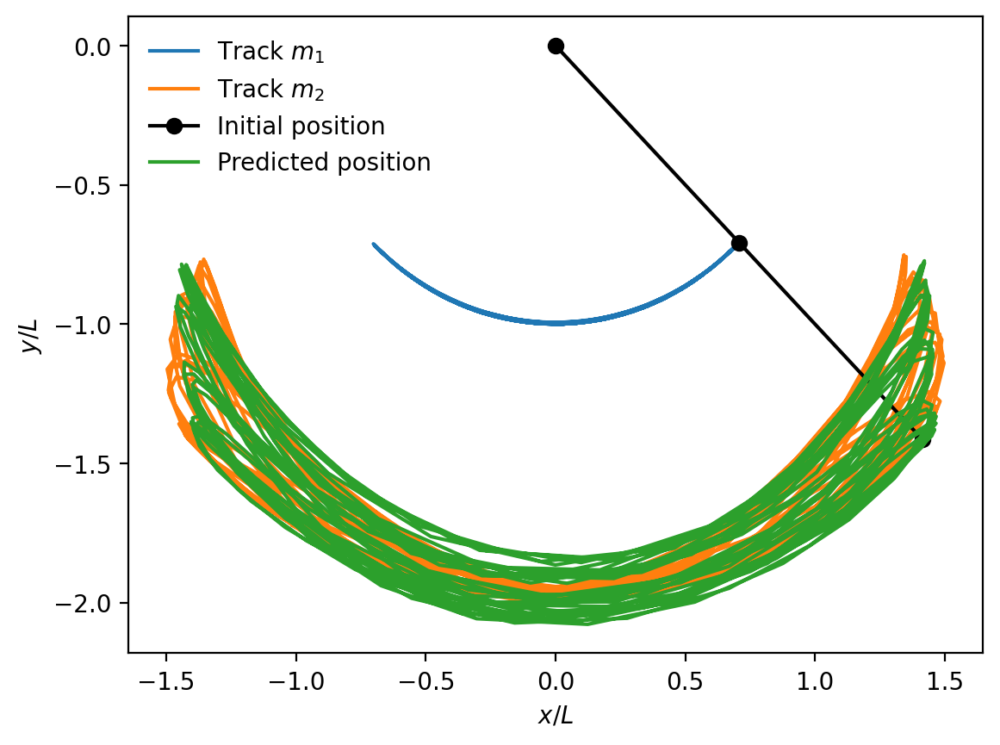

In [ ]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
ax.plot(positions_hat[:,2], positions_hat[:,3], label="Predicted position")
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

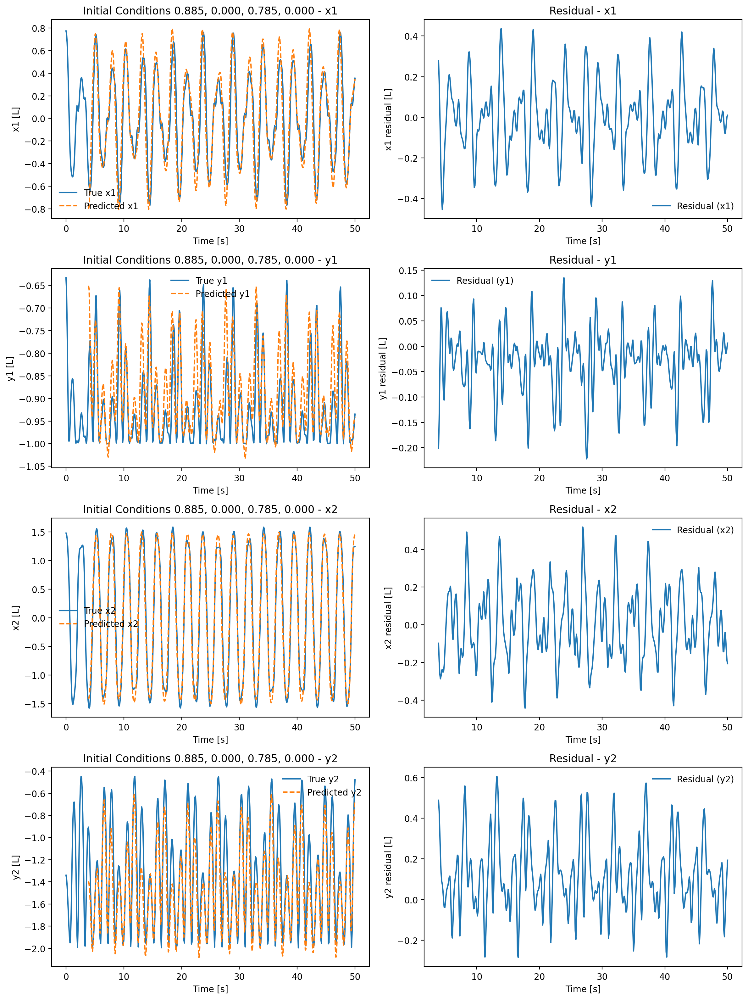

In [ ]:
# Introduce perturbed initial conditions
z0_perturbed = [np.pi/4 + 0.1, 0, np.pi/4, 0]

# Solve initial value problem
ret_pert = solve_ivp(rhs, (0,tmax), z0_perturbed, t_eval=t, args=(L1, L2, m1, m2, g))
z_pert=ret_pert.y

# Extract result
theta1_pert, w1_pert, theta2_pert, w2_pert = z_pert[0], z_pert[1], z_pert[2], z_pert[3]
x1_pert, y1_pert, x2_pert, y2_pert, vx1_pert, vy1_pert, vx2_pert, vy2_pert = to_cartesian(theta1_pert, w1_pert, theta2_pert, w2_pert, L1, L2)

positions_pert = np.stack([x1_pert, y1_pert, x2_pert, y2_pert], axis=1)

# Get our input and label arrays
positions_pertInput,positions_pertLabel = shapeArray(positions_pert,windowsize,offset)

# Calculate the predictions
positions_pert_hat = model.predict_on_batch(positions_pertInput)  # shape: (number of windows, 4)

# Plot true and predicted trajectories
plot_Predictions(positions_pert, positions_pert_hat, windowsize, offset, t, z0_perturbed)

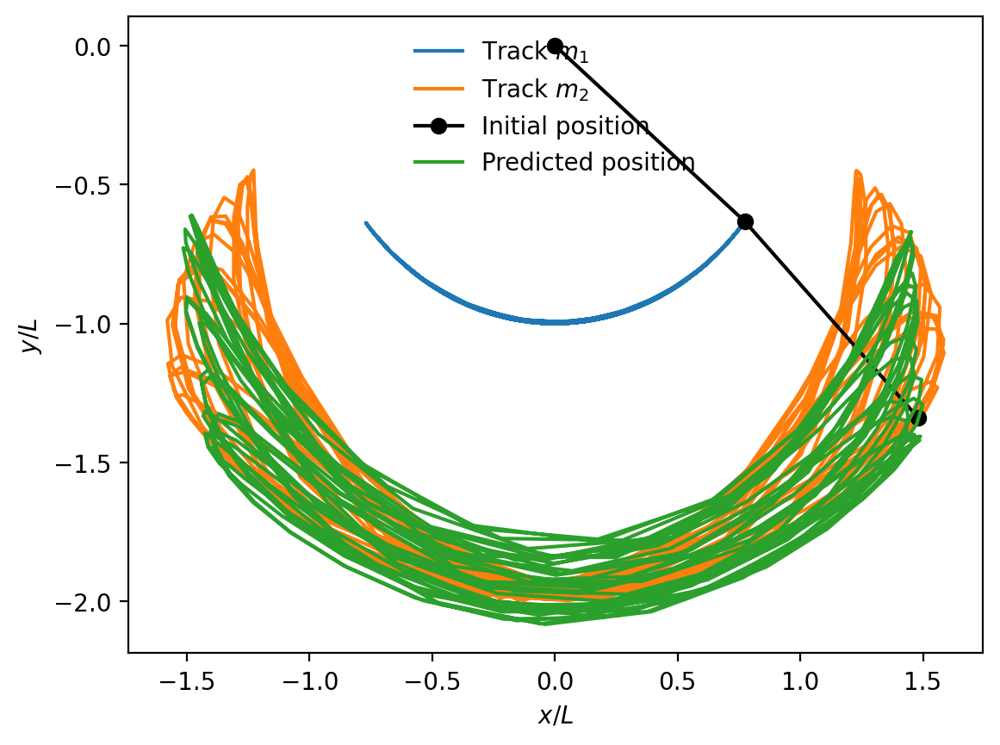

In [ ]:
fig,ax=plt.subplots()
ax.plot(x1_pert, y1_pert, label=r"Track $m_1$")
ax.plot(x2_pert, y2_pert, label=r"Track $m_2$")
ax.plot([0, x1_pert[0], x2_pert[0]], [0, y1_pert[0], y2_pert[0]], "-o", label="Initial position", c='k')
ax.plot(positions_pert_hat[:,2], positions_pert_hat[:,3], label="Predicted position")
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

# Deviation between Predicted Position and Actual Postion for Different Offsets

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                        │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_3 (LSTM)                        │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 226ms/step - accuracy: 0.5292 - loss: 1.0819 - val_accuracy: 0.4301 - val_loss: 0.6464
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.5067 - loss: 0.5536 - val_accuracy: 0.4301 - val_loss: 0.3605
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5167 - loss: 0.3059 - val_accuracy: 0.4301 - val_loss: 0.2689
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.5610 - loss: 0.2219 - val_accuracy: 0.8925 - val_loss: 0.1485
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.7750 - loss: 0.1455 - val_accuracy: 0.5699 - val_loss: 0.1108
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.4868 - loss: 0.1147 - val_accuracy: 0.6882 - val_loss: 0.0809
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7295 - loss: 0.0824 - val_accuracy: 0.9462 - val_loss: 0.0645
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.9483 - loss: 0.0649 - val_accuracy: 0.9355 - val_loss

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_4 (LSTM)                        │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 215ms/step - accuracy: 0.5202 - loss: 1.0498 - val_accuracy: 0.6154 - val_loss: 0.5944
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.6657 - loss: 0.5295 - val_accuracy: 0.8022 - val_loss: 0.2600
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.8476 - loss: 0.2461 - val_accuracy: 0.9341 - val_loss: 0.1713
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.9459 - loss: 0.1644 - val_accuracy: 0.9560 - val_loss: 0.1071
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9634 - loss: 0.1000 - val_accuracy: 0.9451 - val_loss: 0.0807
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.9552 - loss: 0.0734 - val_accuracy: 0.9670 - val_loss: 0.0608
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.9653 - loss: 0.0606 - val_accuracy: 0.9451 - val_loss: 0.0551
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9497 - loss: 0.0570 - val_accuracy: 0.9341 - val_loss

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - accuracy: 0.5911 - loss: 1.0109 - val_accuracy: 0.6517 - val_loss: 0.5859
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.6760 - loss: 0.5422 - val_accuracy: 0.7640 - val_loss: 0.3200
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.8662 - loss: 0.3155 - val_accuracy: 0.8652 - val_loss: 0.2575
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.9366 - loss: 0.2593 - val_accuracy: 0.8989 - val_loss: 0.1547
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.9536 - loss: 0.1441 - val_accuracy: 0.9438 - val_loss: 0.0670
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9780 - loss: 0.0626 - val_accuracy: 0.9326 - val_loss: 0.1005
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - accuracy: 0.9711 - loss: 0.0822 - val_accuracy: 0.9326 - val_loss: 0.0820
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - accuracy: 0.9705 - loss: 0.0660 - val_accuracy: 0.9326 - val_lo

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_8 (LSTM)                        │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_9 (LSTM)                        │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - accuracy: 0.5820 - loss: 1.0216 - val_accuracy: 0.6897 - val_loss: 0.5448
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.7082 - loss: 0.5013 - val_accuracy: 0.3793 - val_loss: 0.3345
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.5208 - loss: 0.3149 - val_accuracy: 0.7126 - val_loss: 0.3032
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8318 - loss: 0.2675 - val_accuracy: 0.8851 - val_loss: 0.2169
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8449 - loss: 0.1917 - val_accuracy: 0.8851 - val_loss: 0.1606
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.8560 - loss: 0.1536 - val_accuracy: 0.9195 - val_loss: 0.1023
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9183 - loss: 0.0912 - val_accuracy: 0.9425 - val_loss: 0.0581
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.9517 - loss: 0.0528 - val_accuracy: 0.9195 - val_loss

Extrapolation offset: 50 steps (t = 5.0 s) => RMSE: 0.0598


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_10 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_11 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 241ms/step - accuracy: 0.1833 - loss: 1.2370 - val_accuracy: 0.8235 - val_loss: 0.8302
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.7943 - loss: 0.7436 - val_accuracy: 0.4588 - val_loss: 0.4576
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.5075 - loss: 0.4012 - val_accuracy: 0.5059 - val_loss: 0.2599
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.6890 - loss: 0.2502 - val_accuracy: 0.9529 - val_loss: 0.1892
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.9097 - loss: 0.2097 - val_accuracy: 0.8353 - val_loss: 0.1481
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8769 - loss: 0.1568 - val_accuracy: 0.9529 - val_loss: 0.0694
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9480 - loss: 0.0728 - val_accuracy: 0.9294 - val_loss: 0.0600
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.9335 - loss: 0.0641 - val_accuracy: 0.9765 - val_loss

Extrapolation offset: 60 steps (t = 6.0 s) => RMSE: 0.0555


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_12 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_13 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 252ms/step - accuracy: 0.5872 - loss: 0.9209 - val_accuracy: 0.3976 - val_loss: 0.5636
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5613 - loss: 0.4280 - val_accuracy: 0.3976 - val_loss: 0.3413
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.5775 - loss: 0.2506 - val_accuracy: 0.8795 - val_loss: 0.2374
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - accuracy: 0.8539 - loss: 0.2190 - val_accuracy: 0.8313 - val_loss: 0.1384
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - accuracy: 0.7818 - loss: 0.1399 - val_accuracy: 0.9518 - val_loss: 0.1069
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - accuracy: 0.9250 - loss: 0.1055 - val_accuracy: 0.9759 - val_loss: 0.0853
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.9465 - loss: 0.0864 - val_accuracy: 0.8072 - val_loss: 0.0598
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.8474 - loss: 0.0635 - val_accuracy: 0.9157 - val_l

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_14 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_15 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 219ms/step - accuracy: 0.3596 - loss: 1.0092 - val_accuracy: 0.5309 - val_loss: 0.6066
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.5079 - loss: 0.5443 - val_accuracy: 0.5309 - val_loss: 0.3407
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.5167 - loss: 0.3320 - val_accuracy: 0.9383 - val_loss: 0.3042
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8150 - loss: 0.2978 - val_accuracy: 0.4691 - val_loss: 0.2251
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.5283 - loss: 0.1985 - val_accuracy: 0.8148 - val_loss: 0.1178
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.8954 - loss: 0.1009 - val_accuracy: 0.9259 - val_loss: 0.0646
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.9279 - loss: 0.0681 - val_accuracy: 0.9136 - val_loss: 0.0668
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.9013 - loss: 0.0689 - val_accuracy: 0.9630 - val_loss

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_16 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_17 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - accuracy: 0.0470 - loss: 1.3663 - val_accuracy: 0.6962 - val_loss: 0.8222
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.5291 - loss: 0.7575 - val_accuracy: 0.5949 - val_loss: 0.4251
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.4932 - loss: 0.3987 - val_accuracy: 0.5949 - val_loss: 0.3146
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.6135 - loss: 0.3044 - val_accuracy: 0.7215 - val_loss: 0.3141
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.6814 - loss: 0.2940 - val_accuracy: 0.4557 - val_loss: 0.2663
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6154 - loss: 0.2333 - val_accuracy: 0.8354 - val_loss: 0.1683
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.9335 - loss: 0.1475 - val_accuracy: 0.9747 - val_loss: 0.1124
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.9354 - loss: 0.1024 - val_accuracy: 0.9873 - val_loss

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_18 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_19 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 335ms/step - accuracy: 0.4984 - loss: 1.0843 - val_accuracy: 0.8961 - val_loss: 0.6254
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.8213 - loss: 0.5567 - val_accuracy: 0.4416 - val_loss: 0.3090
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.5313 - loss: 0.2922 - val_accuracy: 0.7792 - val_loss: 0.2760
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8261 - loss: 0.2640 - val_accuracy: 0.9221 - val_loss: 0.2203
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8667 - loss: 0.2054 - val_accuracy: 0.9091 - val_loss: 0.1342
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.8839 - loss: 0.1245 - val_accuracy: 0.9481 - val_loss: 0.0824
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9687 - loss: 0.0754 - val_accuracy: 0.9481 - val_loss: 0.0568
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.9540 - loss: 0.0555 - val_accuracy: 0.9610 - val_loss

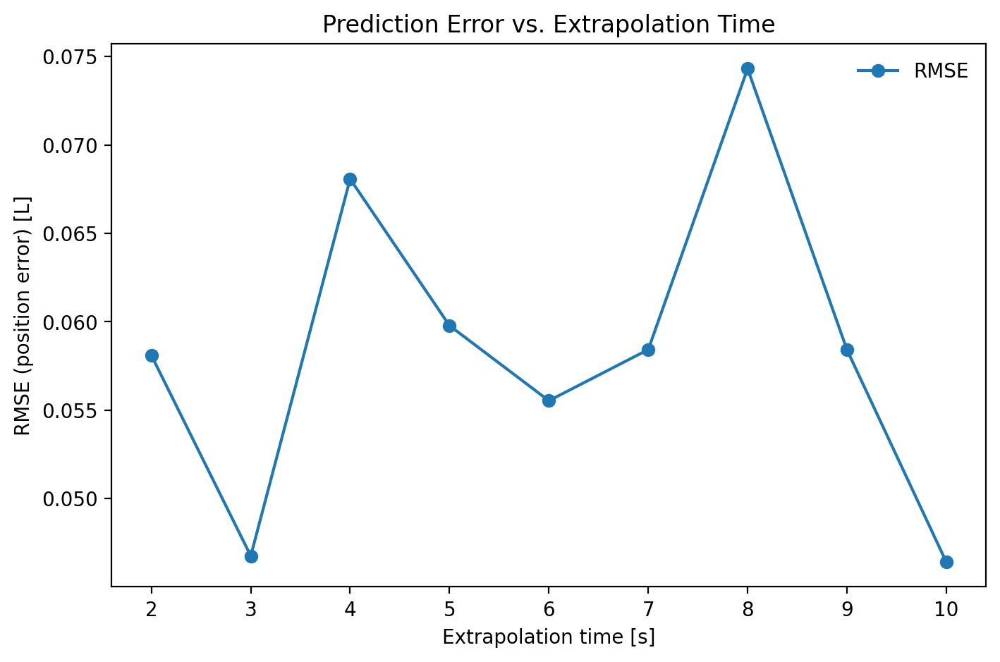

In [ ]:
def offset_Deviation(positions):
  """Calculates the deviation between true and predicted trajectories using the root mean squared error for different offset values for a double pendulum

  Inputs:    positions    numpy array of shape (num_timesteps, 4) with true states.
  """

  # Define offset values to test and initialise error array
  offset_list = np.arange(20, 101, 10)
  errors = []

  for offset in offset_list:

    # Get our input and label arrays
    positions_offset_Input, positions_offset_Label = shapeArray(positions, windowsize, offset)

    # Train the network
    model_offset, history = train_Model(positions_offset_Input, positions_offset_Label, 4, 0)

    # Calculate the predictions and compute the RMSE
    positions_offset_hat = model_offset.predict_on_batch(positions_offset_Input)  # shape: (number of windows, 4)
    rmse = np.sqrt(np.mean((positions_offset_Label - positions_offset_hat) ** 2))
    errors.append(rmse)

    print(f"Extrapolation offset: {offset} steps (t = {offset*dt:.1f} s) => RMSE: {rmse:.4f}")

  # Plot RMSE vs. extrapolation time
  extrapolation_time = offset_list * dt  # Convert steps to seconds
  plt.figure(figsize=(8, 5))
  plt.plot(extrapolation_time, errors, marker='o', label='RMSE')
  plt.xlabel('Extrapolation time [s]')
  plt.ylabel('RMSE (position error) [L]')
  plt.title('Prediction Error vs. Extrapolation Time')
  plt.legend()
  plt.show()

# Compute the deviation between true and predicted trajectories for different offset values
offset_Deviation(positions)

# Implementing New Initial Conditions

In [ ]:
# Starting angles
z0=[np.pi/2,0,np.pi/2,0]

# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

In [ ]:
# Stack the coordinates into one array: shape = (num_timesteps, 4)
positions = np.stack([x1, y1, x2, y2], axis=1)

# Define the window size and offset for how far in the future we want to predict
windowsize = 20           # number of timesteps for input sequence
offset = 20        # predict positions at t0 + 20*dt

# Get our input and label arrays
positionsInput,positionsLabel = shapeArray(positions,windowsize,offset)

model, history = train_Model(positionsInput,positionsLabel, 4, 2)

# Calculate the predictions
positions_hat = model.predict_on_batch(positionsInput)  # shape: (number of windows, 4)

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_20 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_21 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 253ms/step - accuracy: 0.2976 - loss: 0.6396 - val_accuracy: 0.5161 - val_loss: 0.5384
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.3218 - loss: 0.4944 - val_accuracy: 0.5376 - val_loss: 0.4380
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.3247 - loss: 0.4352 - val_accuracy: 0.3118 - val_loss: 0.4117
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.3635 - loss: 0.4100 - val_accuracy: 0.3011 - val_loss: 0.3850
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.3665 - loss: 0.3782 - val_accuracy: 0.2903 - val_loss: 0.3803
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.3951 - loss: 0.3709 - val_accuracy: 0.2903 - val_loss: 0.3860
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.4334 - loss: 0.3621 - val_accuracy: 0.3871 - val_loss: 0.3776
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.4570 - loss: 0.3559 - val_accuracy: 0.4194 - val_loss

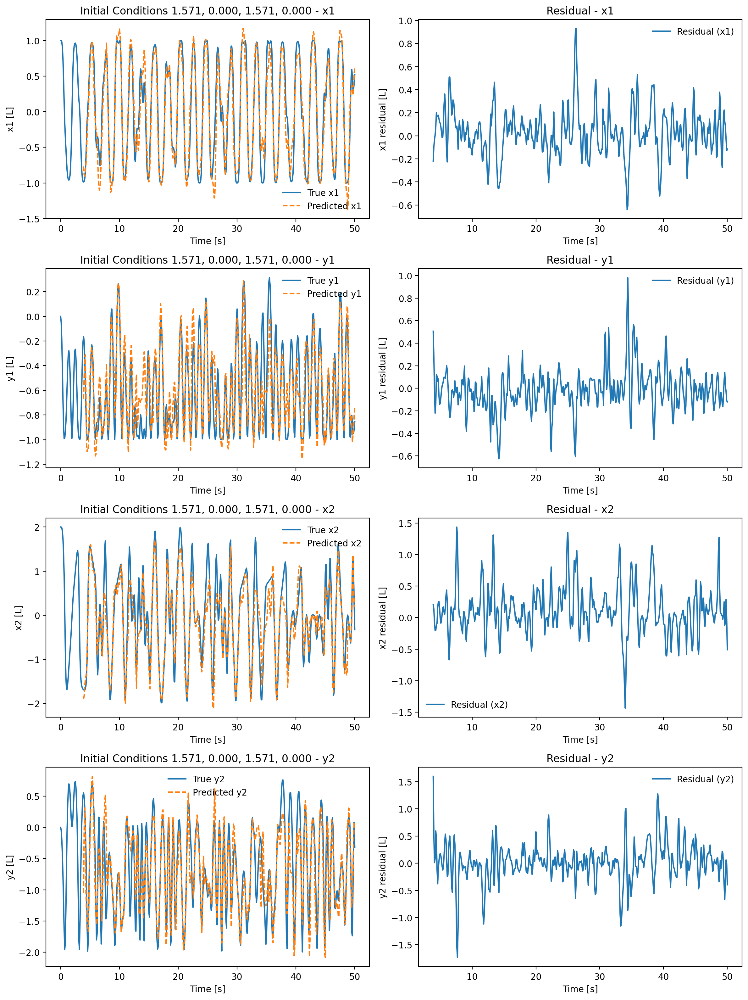

In [ ]:
# Plot true and predicted trajectories
plot_Predictions(positions, positions_hat, windowsize, offset, t, z0)

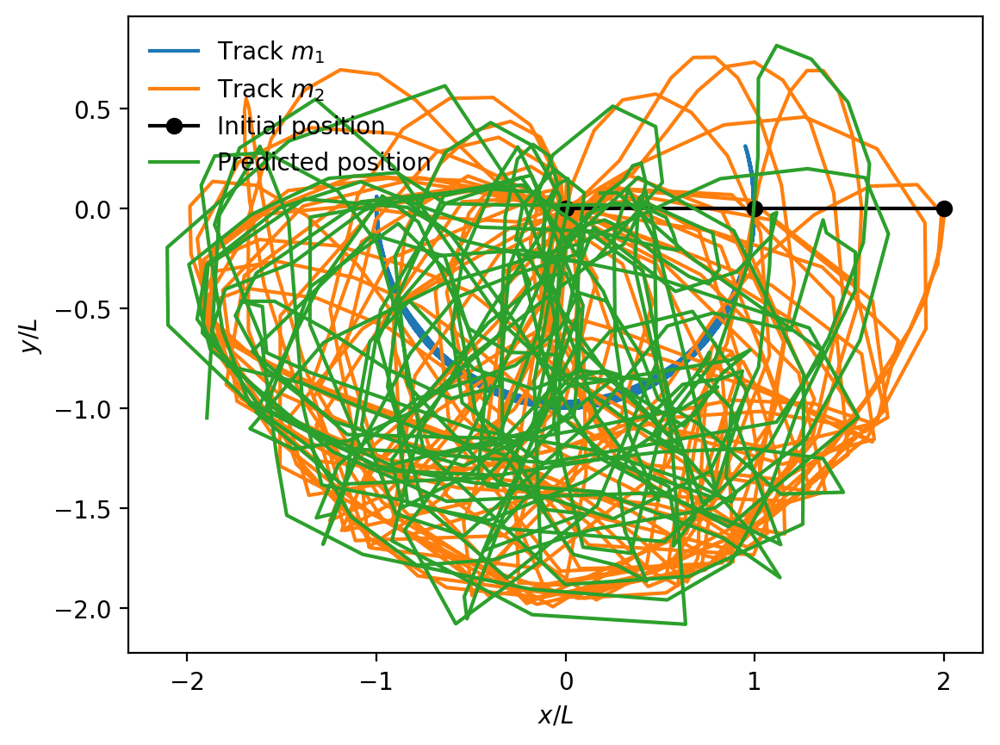

In [ ]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
ax.plot(positions_hat[:,2], positions_hat[:,3], label="Predicted position")
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

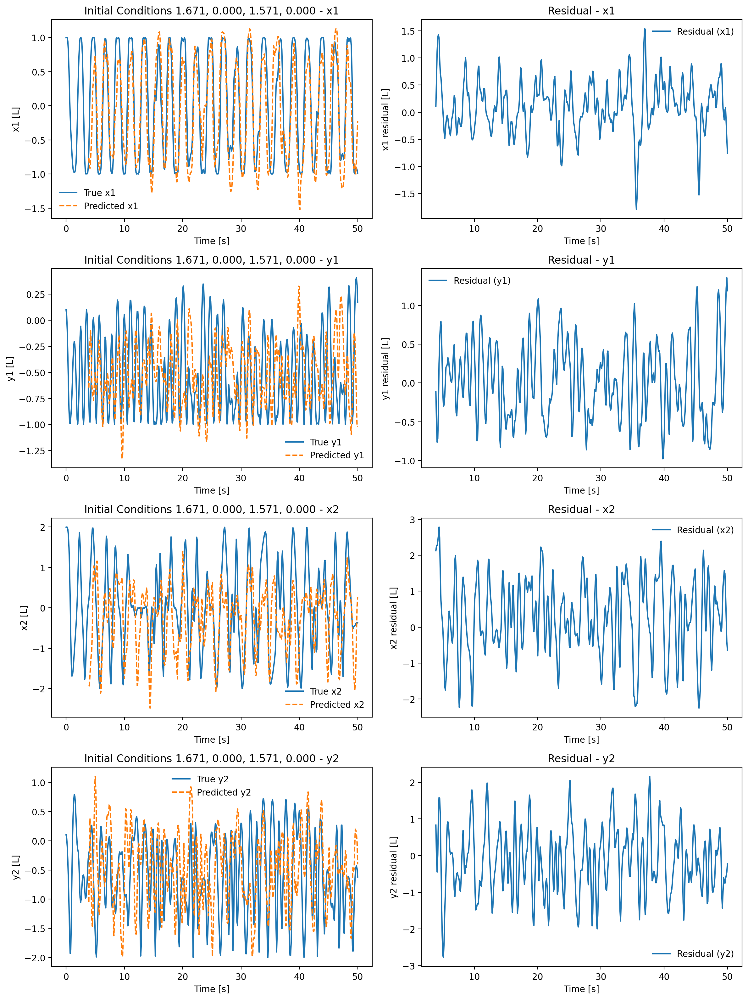

In [ ]:
# Introduce perturbed initial conditions
z0_perturbed = [np.pi/2 + 0.1, 0, np.pi/2, 0]

# Solve initial value problem
ret_pert = solve_ivp(rhs, (0,tmax), z0_perturbed, t_eval=t, args=(L1, L2, m1, m2, g))
z_pert=ret_pert.y

# Extract result
theta1_pert, w1_pert, theta2_pert, w2_pert = z_pert[0], z_pert[1], z_pert[2], z_pert[3]
x1_pert, y1_pert, x2_pert, y2_pert, vx1_pert, vy1_pert, vx2_pert, vy2_pert = to_cartesian(theta1_pert, w1_pert, theta2_pert, w2_pert, L1, L2)

positions_pert = np.stack([x1_pert, y1_pert, x2_pert, y2_pert], axis=1)

#Get our input and label arrays
positions_pertInput,positions_pertLabel = shapeArray(positions_pert,windowsize,offset)

# Calculate the predictions
positions_pert_hat = model.predict_on_batch(positions_pertInput)  # shape: (number of windows, 4)

# Plot true and predicted trajectories
plot_Predictions(positions_pert, positions_pert_hat, windowsize, offset, t, z0_perturbed)

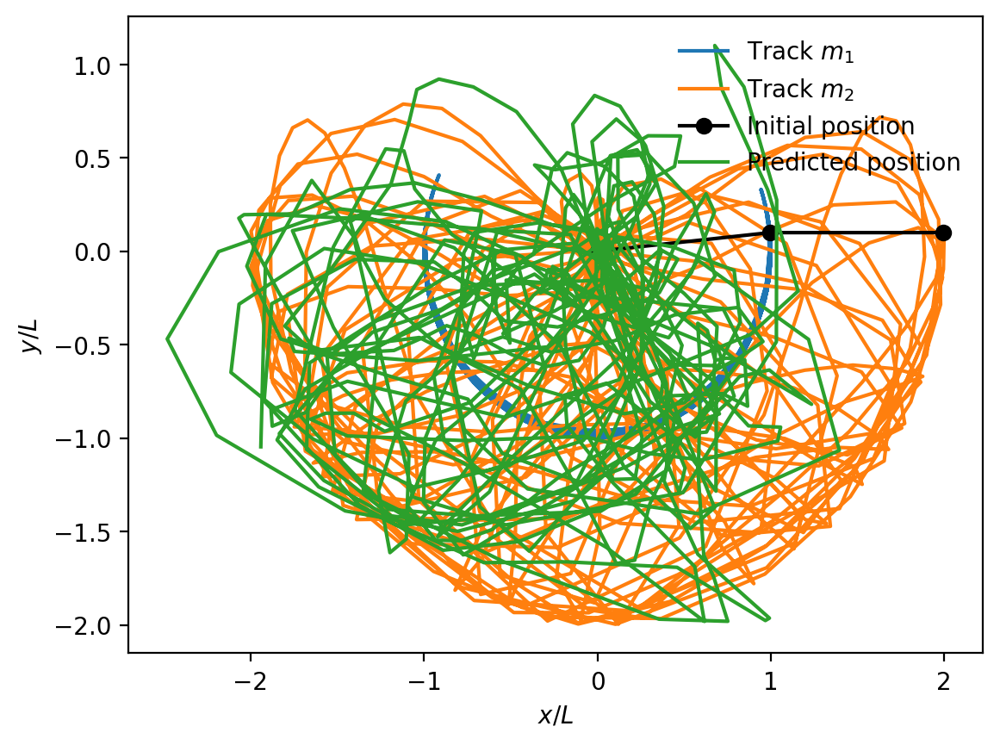

In [ ]:
fig,ax=plt.subplots()
ax.plot(x1_pert, y1_pert, label=r"Track $m_1$")
ax.plot(x2_pert, y2_pert, label=r"Track $m_2$")
ax.plot([0, x1_pert[0], x2_pert[0]], [0, y1_pert[0], y2_pert[0]], "-o", label="Initial position", c='k')
ax.plot(positions_pert_hat[:,2], positions_pert_hat[:,3], label="Predicted position")
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_22 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_23 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 259ms/step - accuracy: 0.2256 - loss: 0.6839 - val_accuracy: 0.4516 - val_loss: 0.5870
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.3360 - loss: 0.5592 - val_accuracy: 0.4624 - val_loss: 0.4611
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.3118 - loss: 0.4533 - val_accuracy: 0.4624 - val_loss: 0.4138
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.4420 - loss: 0.4183 - val_accuracy: 0.3333 - val_loss: 0.4097
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.3801 - loss: 0.4011 - val_accuracy: 0.3118 - val_loss: 0.3970
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.3551 - loss: 0.3814 - val_accuracy: 0.3118 - val_loss: 0.3885
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.4264 - loss: 0.3610 - val_accuracy: 0.3548 - val_loss: 0.3770
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.4906 - loss: 0.3429 - val_accuracy: 0.4194 - val_loss

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_24 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_25 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 237ms/step - accuracy: 0.3086 - loss: 0.7019 - val_accuracy: 0.3407 - val_loss: 0.5388
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.3820 - loss: 0.5528 - val_accuracy: 0.3407 - val_loss: 0.4530
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.3944 - loss: 0.4494 - val_accuracy: 0.3187 - val_loss: 0.4441
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.3727 - loss: 0.4366 - val_accuracy: 0.3187 - val_loss: 0.3990
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.3951 - loss: 0.4108 - val_accuracy: 0.3516 - val_loss: 0.3608
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3757 - loss: 0.3880 - val_accuracy: 0.4176 - val_loss: 0.3390
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.3995 - loss: 0.3773 - val_accuracy: 0.4176 - val_loss: 0.3299
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3988 - loss: 0.3714 - val_accuracy: 0.3407 - val_loss

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_26 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_27 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - accuracy: 0.1906 - loss: 0.7568 - val_accuracy: 0.3708 - val_loss: 0.6242
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3918 - loss: 0.5789 - val_accuracy: 0.3034 - val_loss: 0.4961
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3473 - loss: 0.4779 - val_accuracy: 0.2584 - val_loss: 0.4457
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.3329 - loss: 0.4453 - val_accuracy: 0.2360 - val_loss: 0.4376
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.3317 - loss: 0.4237 - val_accuracy: 0.2584 - val_loss: 0.4296
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3267 - loss: 0.3887 - val_accuracy: 0.3258 - val_loss: 0.4302
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.3304 - loss: 0.3775 - val_accuracy: 0.4045 - val_loss: 0.4337
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.3255 - loss: 0.3781 - val_accuracy: 0.3933 - val_loss

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_28 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_29 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 381ms/step - accuracy: 0.3691 - loss: 0.7070 - val_accuracy: 0.3563 - val_loss: 0.5149
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - accuracy: 0.3592 - loss: 0.5501 - val_accuracy: 0.3448 - val_loss: 0.4463
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.3982 - loss: 0.4918 - val_accuracy: 0.3793 - val_loss: 0.4373
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.3422 - loss: 0.4876 - val_accuracy: 0.3678 - val_loss: 0.4180
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.3664 - loss: 0.4593 - val_accuracy: 0.2874 - val_loss: 0.4181
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.3609 - loss: 0.4368 - val_accuracy: 0.2759 - val_loss: 0.4187
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.3699 - loss: 0.4408 - val_accuracy: 0.2874 - val_loss: 0.4220
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.3762 - loss: 0.4376 - val_accuracy: 0.2644 - val_loss

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_30 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_31 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - accuracy: 0.2548 - loss: 0.6990 - val_accuracy: 0.3765 - val_loss: 0.5538
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.3518 - loss: 0.5387 - val_accuracy: 0.3765 - val_loss: 0.4698
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.4157 - loss: 0.4627 - val_accuracy: 0.3412 - val_loss: 0.4712
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.3897 - loss: 0.4569 - val_accuracy: 0.3529 - val_loss: 0.4534
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.3723 - loss: 0.4328 - val_accuracy: 0.3529 - val_loss: 0.4417
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.3822 - loss: 0.4414 - val_accuracy: 0.3765 - val_loss: 0.4361
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.3783 - loss: 0.4293 - val_accuracy: 0.3647 - val_loss: 0.4269
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.3864 - loss: 0.4292 - val_accuracy: 0.4118 - val_loss

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_32 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_33 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 236ms/step - accuracy: 0.2559 - loss: 0.6995 - val_accuracy: 0.3373 - val_loss: 0.5460
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.4053 - loss: 0.5446 - val_accuracy: 0.3373 - val_loss: 0.4690
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.4240 - loss: 0.4858 - val_accuracy: 0.3735 - val_loss: 0.4623
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.3681 - loss: 0.4940 - val_accuracy: 0.4096 - val_loss: 0.4348
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.3251 - loss: 0.4666 - val_accuracy: 0.4096 - val_loss: 0.4289
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.2971 - loss: 0.4641 - val_accuracy: 0.3855 - val_loss: 0.4355
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.3521 - loss: 0.4579 - val_accuracy: 0.3855 - val_loss: 0.4354
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.3811 - loss: 0.4644 - val_accuracy: 0.3735 - val_loss

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_34 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_35 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - accuracy: 0.2225 - loss: 0.6989 - val_accuracy: 0.3704 - val_loss: 0.5719
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.3646 - loss: 0.5658 - val_accuracy: 0.3951 - val_loss: 0.4996
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.3600 - loss: 0.4983 - val_accuracy: 0.3580 - val_loss: 0.5181
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.3625 - loss: 0.5001 - val_accuracy: 0.3704 - val_loss: 0.5036
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.4021 - loss: 0.4807 - val_accuracy: 0.3704 - val_loss: 0.4940
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.3529 - loss: 0.4741 - val_accuracy: 0.3704 - val_loss: 0.4972
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.4050 - loss: 0.4817 - val_accuracy: 0.3951 - val_loss: 0.4971
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.3475 - loss: 0.4808 - val_accuracy: 0.3951 - val_loss

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_36 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_37 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - accuracy: 0.2639 - loss: 0.6720 - val_accuracy: 0.3671 - val_loss: 0.5416
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.3215 - loss: 0.5389 - val_accuracy: 0.3924 - val_loss: 0.4799
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.3568 - loss: 0.4975 - val_accuracy: 0.4684 - val_loss: 0.4999
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.3575 - loss: 0.5020 - val_accuracy: 0.4051 - val_loss: 0.4868
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - accuracy: 0.3704 - loss: 0.4861 - val_accuracy: 0.4051 - val_loss: 0.4762
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.3691 - loss: 0.4764 - val_accuracy: 0.4051 - val_loss: 0.4789
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - accuracy: 0.3679 - loss: 0.4811 - val_accuracy: 0.4684 - val_loss: 0.4764
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.3898 - loss: 0.4706 - val_accuracy: 0.5063 - val_l

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_38 (LSTM)                       │ (None, None, 100)           │          42,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_39 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 4)                   │             204 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 72,404 (282.83 KB)

 Trainable params: 72,404 (282.83 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 211ms/step - accuracy: 0.2234 - loss: 0.7038 - val_accuracy: 0.3896 - val_loss: 0.5227
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.3511 - loss: 0.5634 - val_accuracy: 0.4286 - val_loss: 0.4567
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.4018 - loss: 0.4850 - val_accuracy: 0.4156 - val_loss: 0.4837
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.4180 - loss: 0.4857 - val_accuracy: 0.3636 - val_loss: 0.4966
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.3761 - loss: 0.4751 - val_accuracy: 0.3766 - val_loss: 0.4831
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.4202 - loss: 0.4570 - val_accuracy: 0.3766 - val_loss: 0.4738
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.4449 - loss: 0.4607 - val_accuracy: 0.3636 - val_loss: 0.4690
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.4359 - loss: 0.4496 - val_accuracy: 0.3506 - val_loss

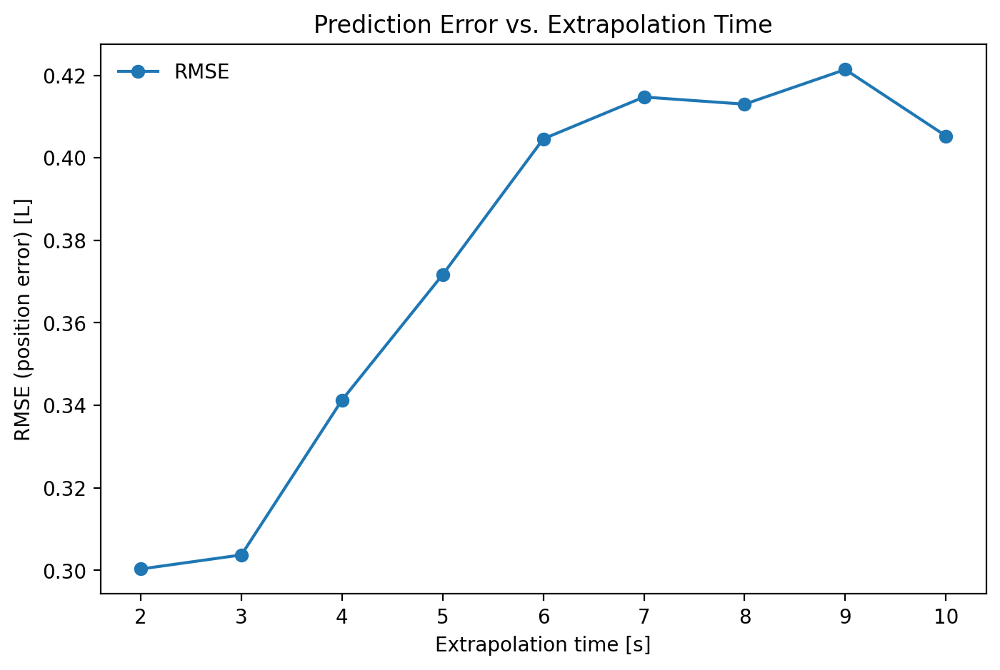

In [ ]:
# Compute the deviation between true and predicted trajectories for different offset values
offset_Deviation(positions)

# Training a Recurrent Neural Network on Only the Second Mass

In [ ]:
# Starting angles
z0=[np.pi/4,0,np.pi/4,0]

# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y
print(np.shape(z))

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

# Stack the coordinates into one array: shape = (num_timesteps, 2)
positions = np.stack([x2, y2], axis=1)
print(positions.shape)

# Define the window size and offset for how far in the future we want to predict
windowsize = 20           # number of timesteps for input sequence
offset = 20        # predict positions at t0 + 20*dt

# Get our input and label arrays
positionsInput,positionsLabel = shapeArray(positions,windowsize,offset)

print("Input shape:", positionsInput.shape)  # (number of windows, windowsize, 2)
print("Output shape:", positionsLabel.shape)  # (number of windows, 2)

model, history = train_Model(positionsInput,positionsLabel,2,2)

(4, 501)
(501, 2)
Input shape: (462, 20, 2)
Output shape: (462, 2)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_40 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_41 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 228ms/step - accuracy: 0.4500 - loss: 1.7683 - val_accuracy: 0.8387 - val_loss: 1.0354
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8182 - loss: 0.9470 - val_accuracy: 0.8387 - val_loss: 0.5580
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.8369 - loss: 0.5275 - val_accuracy: 0.8387 - val_loss: 0.4887
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.8182 - loss: 0.4638 - val_accuracy: 0.8387 - val_loss: 0.4148
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8169 - loss: 0.3479 - val_accuracy: 0.8387 - val_loss: 0.2347
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.8044 - loss: 0.1921 - val_accuracy: 0.8387 - val_loss: 0.1219
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.8252 - loss: 0.1265 - val_accuracy: 0.9355 - val_loss: 0.0863
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.9133 - loss: 0.0955 - val_accuracy: 0.9462 - val_loss

positions_hat.shape = (462, 2)


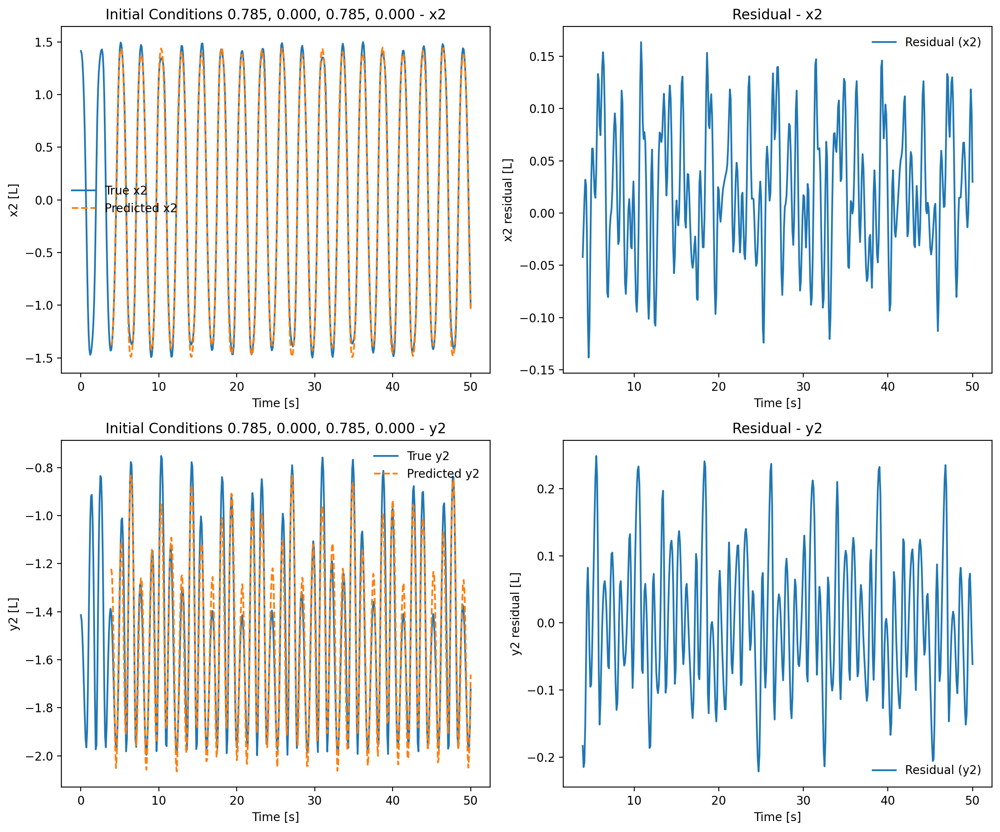

In [ ]:
# Calculate the predictions
positions_hat = model.predict_on_batch(positionsInput)  # shape: (number of windows, 2)
print("positions_hat.shape =", positions_hat.shape)

def plot_Predictions_m2(positions, positions_hat, windowsize, offset, t, z0):
    """Plots the true and predicted positions and their residuals for a double pendulum.

    Inputs:    positions        numpy array of shape (num_timesteps, 2) with true states.
               positions_hat    numpy array of shape (samples, 2) with predictions.
               windowsize       integer, number of timesteps used as input.
               offset           integer, prediction offset (in number of timesteps).
               t                numpy array of time values corresponding to the true data.
               z0               initial conditions.
    """

    # Compute time indices for the predictions
    num_samples = positions_hat.shape[0]
    start_index = windowsize + offset - 1  # e.g. 20 + 20 - 1 = 39
    end_index = start_index + num_samples  # 39 + num_samples
    pred_times = t[start_index:end_index]

    fig, ax = plt.subplots(2, 2, figsize=(12, 10))

    # Plot x2 vs. time
    ax[0,0].plot(t, positions[:,0], label='True x2')
    ax[0,0].plot(pred_times, positions_hat[:,0], '--', label='Predicted x2')
    ax[0,0].set_xlabel('Time [s]')
    ax[0,0].set_ylabel('x2 [L]')
    ax[0,0].set_title("Initial Conditions " + ", ".join([f"{val:.3f}" for val in z0]) + " - x2")
    ax[0,0].legend()

    # Plot x2 residual
    res_x2 = positions[start_index:end_index, 0] - positions_hat[:,0]
    ax[0,1].plot(pred_times, res_x2, label='Residual (x2)')
    ax[0,1].set_xlabel('Time [s]')
    ax[0,1].set_ylabel('x2 residual [L]')
    ax[0,1].set_title('Residual - x2')
    ax[0,1].legend()

    # Plot y2 vs. time
    ax[1,0].plot(t, positions[:,1], label='True y2')
    ax[1,0].plot(pred_times, positions_hat[:,1], '--', label='Predicted y2')
    ax[1,0].set_xlabel('Time [s]')
    ax[1,0].set_ylabel('y2 [L]')
    ax[1,0].set_title("Initial Conditions " + ", ".join([f"{val:.3f}" for val in z0]) + " - y2")
    ax[1,0].legend()

    # Plot y2 residual
    res_y2 = positions[start_index:end_index, 1] - positions_hat[:,1]
    ax[1,1].plot(pred_times, res_y2, label='Residual (y2)')
    ax[1,1].set_xlabel('Time [s]')
    ax[1,1].set_ylabel('y2 residual [L]')
    ax[1,1].set_title('Residual - y2')
    ax[1,1].legend()

    plt.tight_layout()
    plt.show()

# Plot true and predicted trajectories
plot_Predictions_m2(positions, positions_hat, windowsize, offset, t, z0)

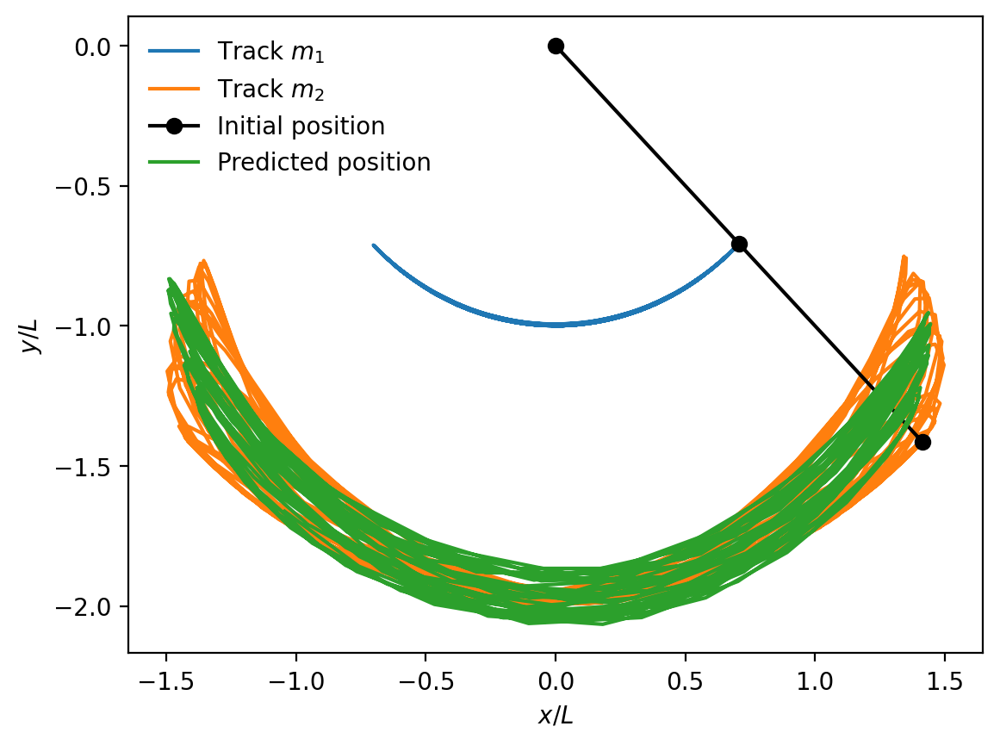

In [ ]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
ax.plot(positions_hat[:,0], positions_hat[:,1], label="Predicted position")
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

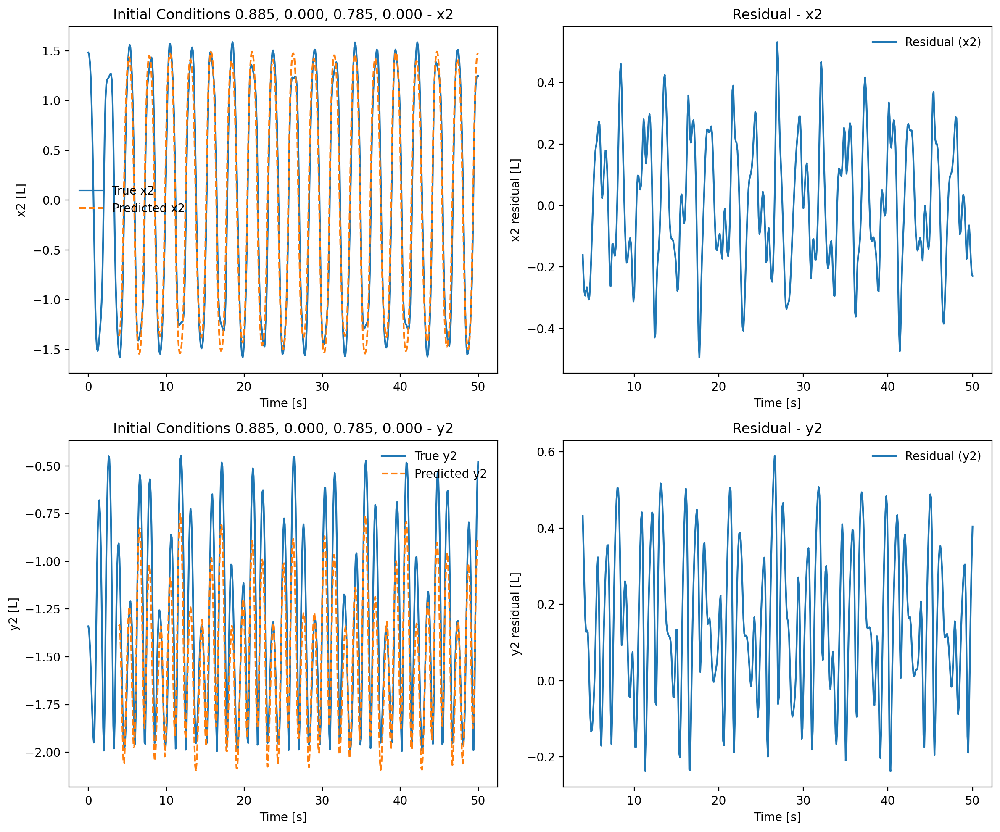

In [ ]:
# Introduce perturbed initial conditions
z0_perturbed = [np.pi/4 + 0.1, 0, np.pi/4, 0]

# Solve initial value problem
ret_pert = solve_ivp(rhs, (0,tmax), z0_perturbed, t_eval=t, args=(L1, L2, m1, m2, g))
z_pert=ret_pert.y

# Extract result
theta1_pert, w1_pert, theta2_pert, w2_pert = z_pert[0], z_pert[1], z_pert[2], z_pert[3]
x1_pert, y1_pert, x2_pert, y2_pert, vx1_pert, vy1_pert, vx2_pert, vy2_pert = to_cartesian(theta1_pert, w1_pert, theta2_pert, w2_pert, L1, L2)

positions_pert = np.stack([x2_pert, y2_pert], axis=1)

# Get our input and label arrays
positions_pertInput,positions_pertLabel = shapeArray(positions_pert,windowsize,offset)

# Calculate the predictions
positions_pert_hat = model.predict_on_batch(positions_pertInput)  # shape: (samples, 2)

# Plot true and predicted trajectories
plot_Predictions_m2(positions_pert, positions_pert_hat, windowsize, offset, t, z0_perturbed)

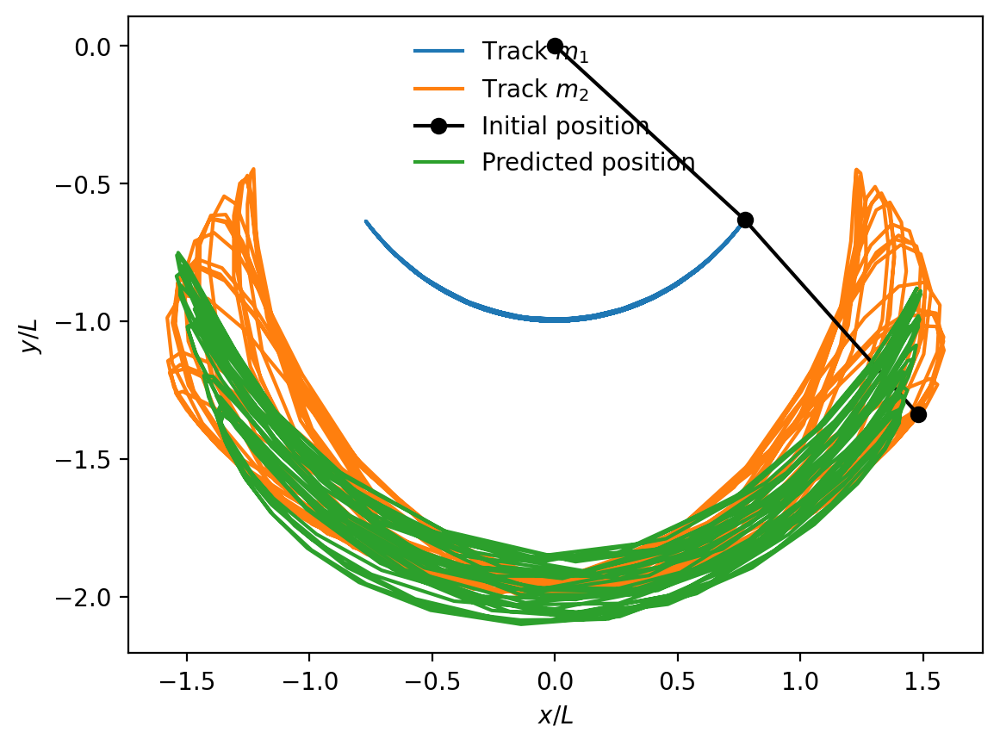

In [ ]:
fig,ax=plt.subplots()
ax.plot(x1_pert, y1_pert, label=r"Track $m_1$")
ax.plot(x2_pert, y2_pert, label=r"Track $m_2$")
ax.plot([0, x1_pert[0], x2_pert[0]], [0, y1_pert[0], y2_pert[0]], "-o", label="Initial position", c='k')
ax.plot(positions_pert_hat[:,0], positions_pert_hat[:,1], label="Predicted position")
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_42 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_43 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - accuracy: 0.4377 - loss: 1.6782 - val_accuracy: 0.8387 - val_loss: 0.9987
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.8207 - loss: 0.8398 - val_accuracy: 0.8387 - val_loss: 0.5115
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.8194 - loss: 0.4510 - val_accuracy: 0.8387 - val_loss: 0.4685
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.8232 - loss: 0.3946 - val_accuracy: 0.8387 - val_loss: 0.2608
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.8194 - loss: 0.2494 - val_accuracy: 0.8387 - val_loss: 0.1493
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.8282 - loss: 0.1504 - val_accuracy: 0.8387 - val_loss: 0.1306
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.8500 - loss: 0.1255 - val_accuracy: 0.9247 - val_loss: 0.1087
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.9090 - loss: 0.0970 - val_accuracy: 0.9140 - val_loss

Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_44 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_45 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 228ms/step - accuracy: 0.4445 - loss: 1.8646 - val_accuracy: 0.8352 - val_loss: 1.2589
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.8355 - loss: 1.1241 - val_accuracy: 0.8352 - val_loss: 0.7238
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.8192 - loss: 0.6390 - val_accuracy: 0.8352 - val_loss: 0.4475
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.8305 - loss: 0.4322 - val_accuracy: 0.8352 - val_loss: 0.3482
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.8230 - loss: 0.3433 - val_accuracy: 0.8352 - val_loss: 0.1711
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.8192 - loss: 0.1593 - val_accuracy: 0.8352 - val_loss: 0.1031
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8396 - loss: 0.0961 - val_accuracy: 0.9670 - val_loss: 0.1225
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.9305 - loss: 0.1043 - val_accuracy: 0.9560 - val_loss

Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_46 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_47 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 229ms/step - accuracy: 0.6272 - loss: 1.7198 - val_accuracy: 0.7978 - val_loss: 0.9502
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.8417 - loss: 0.8784 - val_accuracy: 0.7978 - val_loss: 0.5489
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.8367 - loss: 0.5829 - val_accuracy: 0.7978 - val_loss: 0.5490
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - accuracy: 0.8454 - loss: 0.5588 - val_accuracy: 0.7978 - val_loss: 0.4085
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8304 - loss: 0.3867 - val_accuracy: 0.7978 - val_loss: 0.2511
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.8592 - loss: 0.2183 - val_accuracy: 0.9551 - val_loss: 0.1346
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.9278 - loss: 0.1287 - val_accuracy: 0.9775 - val_loss: 0.1317
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.8863 - loss: 0.1252 - val_accuracy: 0.9438 - val_loss

Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_48 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_49 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - accuracy: 0.4747 - loss: 1.7045 - val_accuracy: 0.8506 - val_loss: 1.0379
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.8425 - loss: 1.0020 - val_accuracy: 0.8506 - val_loss: 0.5832
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.8300 - loss: 0.5999 - val_accuracy: 0.8506 - val_loss: 0.5150
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8450 - loss: 0.4861 - val_accuracy: 0.8506 - val_loss: 0.4969
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.8487 - loss: 0.4079 - val_accuracy: 0.8506 - val_loss: 0.3810
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.8425 - loss: 0.2988 - val_accuracy: 0.8506 - val_loss: 0.2161
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.8508 - loss: 0.1811 - val_accuracy: 0.9310 - val_loss: 0.1608
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9365 - loss: 0.1426 - val_accuracy: 0.9425 - val_loss

Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_50 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_51 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 259ms/step - accuracy: 0.8127 - loss: 1.5727 - val_accuracy: 0.8353 - val_loss: 0.8758
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step - accuracy: 0.8264 - loss: 0.7699 - val_accuracy: 0.8353 - val_loss: 0.4252
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - accuracy: 0.8214 - loss: 0.4399 - val_accuracy: 0.8353 - val_loss: 0.3860
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.8314 - loss: 0.3887 - val_accuracy: 0.8353 - val_loss: 0.2190
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.8027 - loss: 0.2191 - val_accuracy: 0.8353 - val_loss: 0.1251
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.8319 - loss: 0.1190 - val_accuracy: 0.9059 - val_loss: 0.1081
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.9080 - loss: 0.0975 - val_accuracy: 0.8941 - val_loss: 0.0969
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.9363 - loss: 0.0921 - val_accuracy: 0.8706 - val_lo

Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_52 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_53 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 265ms/step - accuracy: 0.4342 - loss: 1.7480 - val_accuracy: 0.7952 - val_loss: 1.0011
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.8621 - loss: 0.8895 - val_accuracy: 0.7952 - val_loss: 0.5542
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.8671 - loss: 0.4743 - val_accuracy: 0.7952 - val_loss: 0.5549
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8509 - loss: 0.4392 - val_accuracy: 0.7952 - val_loss: 0.3874
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.8634 - loss: 0.2595 - val_accuracy: 0.7952 - val_loss: 0.1529
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.8559 - loss: 0.1198 - val_accuracy: 0.7952 - val_loss: 0.0748
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.8829 - loss: 0.1001 - val_accuracy: 0.9157 - val_loss: 0.0756
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.9630 - loss: 0.0987 - val_accuracy: 0.9277 - val_loss

Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_54 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_55 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 233ms/step - accuracy: 0.6083 - loss: 1.8072 - val_accuracy: 0.8642 - val_loss: 1.1077
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.8354 - loss: 0.9774 - val_accuracy: 0.8642 - val_loss: 0.5661
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.8292 - loss: 0.5036 - val_accuracy: 0.8642 - val_loss: 0.3627
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - accuracy: 0.8367 - loss: 0.3595 - val_accuracy: 0.8642 - val_loss: 0.2378
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - accuracy: 0.8342 - loss: 0.2153 - val_accuracy: 0.8642 - val_loss: 0.0816
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 118ms/step - accuracy: 0.8758 - loss: 0.0896 - val_accuracy: 0.8642 - val_loss: 0.1110
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.8908 - loss: 0.1120 - val_accuracy: 0.8765 - val_loss: 0.1063
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.9033 - loss: 0.1057 - val_accuracy: 0.9259 - val_l

Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_56 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_57 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - accuracy: 0.8384 - loss: 1.5506 - val_accuracy: 0.7975 - val_loss: 0.8512
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.8447 - loss: 0.7713 - val_accuracy: 0.7975 - val_loss: 0.6534
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.8422 - loss: 0.6212 - val_accuracy: 0.7975 - val_loss: 0.6286
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.8547 - loss: 0.5539 - val_accuracy: 0.7975 - val_loss: 0.4084
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.8384 - loss: 0.3700 - val_accuracy: 0.7975 - val_loss: 0.2697
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.8309 - loss: 0.2465 - val_accuracy: 0.7975 - val_loss: 0.1409
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.8352 - loss: 0.1293 - val_accuracy: 0.9494 - val_loss: 0.0933
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.9280 - loss: 0.0994 - val_accuracy: 0.9114 - val_loss

Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_58 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_59 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 235ms/step - accuracy: 0.8257 - loss: 1.5853 - val_accuracy: 0.8831 - val_loss: 0.8549
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.8195 - loss: 0.7985 - val_accuracy: 0.8831 - val_loss: 0.4373
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.8307 - loss: 0.4670 - val_accuracy: 0.8831 - val_loss: 0.4419
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8282 - loss: 0.4136 - val_accuracy: 0.8831 - val_loss: 0.3148
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.8320 - loss: 0.2782 - val_accuracy: 0.8831 - val_loss: 0.2011
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8451 - loss: 0.1838 - val_accuracy: 0.8961 - val_loss: 0.1428
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.8614 - loss: 0.1358 - val_accuracy: 0.9481 - val_loss: 0.1068
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.9011 - loss: 0.1054 - val_accuracy: 0.9481 - val_loss

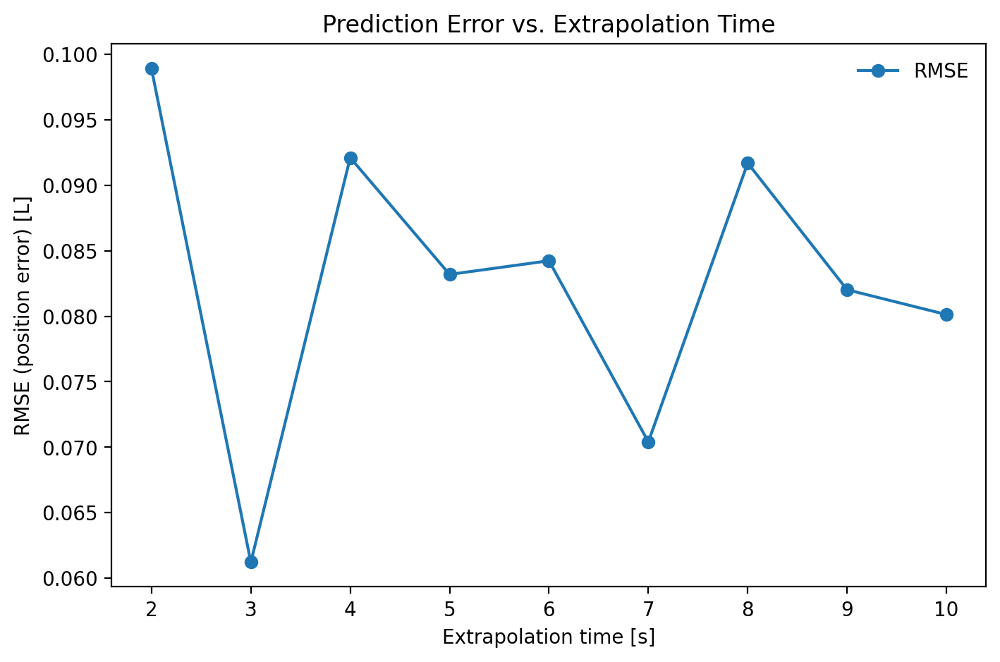

In [ ]:
def offset_Deviation_m2(positions):
  """Calculates the deviation between true and predicted trajectories using the root mean squared error for different offset values for a double pendulum

  Inputs:    positions    numpy array of shape (num_timesteps, 2) with true states.
  """

  # Define offset values to test and initialise error array
  offset_list = np.arange(20, 101, 10)
  errors = []

  for offset in offset_list:

    # Get our input and label arrays
    positions_offset_Input, positions_offset_Label = shapeArray(positions, windowsize, offset)

    model_offset, history = train_Model(positions_offset_Input, positions_offset_Label, 2, 0)

    # Calculate the predictions and compute the RMSE
    positions_offset_hat = model_offset.predict_on_batch(positions_offset_Input)  # shape: (number of windows, 2)
    rmse = np.sqrt(np.mean((positions_offset_Label - positions_offset_hat) ** 2))
    errors.append(rmse)

    print(f"Extrapolation offset: {offset} steps (t = {offset*dt:.1f} s) => RMSE: {rmse:.4f}")

  # Plot RMSE vs. extrapolation time
  extrapolation_time = offset_list * dt  # Convert steps to seconds
  plt.figure(figsize=(8, 5))
  plt.plot(extrapolation_time, errors, marker='o', label='RMSE')
  plt.xlabel('Extrapolation time [s]')
  plt.ylabel('RMSE (position error) [L]')
  plt.title('Prediction Error vs. Extrapolation Time')
  plt.legend()
  plt.show()

# Compute the deviation between true and predicted trajectories for different offset values
offset_Deviation_m2(positions)

In [ ]:
# Starting angles
z0=[np.pi/2,0,np.pi/2,0]

# Solve initial value problem
ret = solve_ivp(rhs, (0,tmax), z0, t_eval=t, args=(L1, L2, m1, m2, g))
z=ret.y

# Extract result
theta1, w1, theta2, w2 = z[0], z[1], z[2], z[3]
x1, y1, x2, y2, vx1, vy1, vx2, vy2 = to_cartesian(theta1, w1, theta2, w2, L1, L2)

In [ ]:
# Stack the coordinates into one array: shape = (num_timesteps, 2)
positions = np.stack([x2, y2], axis=1)

# Define the window size and offset for how far in the future we want to predict
windowsize = 20           # number of timesteps for input sequence
offset = 20        # predict positions at t0 + 20*dt

#Get our input and label arrays
positionsInput,positionsLabel = shapeArray(positions,windowsize,offset)

model, history = train_Model(positionsInput,positionsLabel,2,2)

# Calculate the predictions
positions_hat = model.predict_on_batch(positionsInput)  # shape: (number of windows, 2)

Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_60 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_61 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - accuracy: 0.4835 - loss: 0.8686 - val_accuracy: 0.8172 - val_loss: 0.8149
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.6938 - loss: 0.6848 - val_accuracy: 0.8065 - val_loss: 0.7174
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.6700 - loss: 0.6739 - val_accuracy: 0.8065 - val_loss: 0.6593
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6650 - loss: 0.6364 - val_accuracy: 0.8065 - val_loss: 0.6217
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.6813 - loss: 0.6158 - val_accuracy: 0.8065 - val_loss: 0.6158
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.6651 - loss: 0.6102 - val_accuracy: 0.7849 - val_loss: 0.6404
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.6479 - loss: 0.5817 - val_accuracy: 0.7204 - val_loss: 0.6588
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.6560 - loss: 0.5897 - val_accuracy: 0.7204 - val_loss

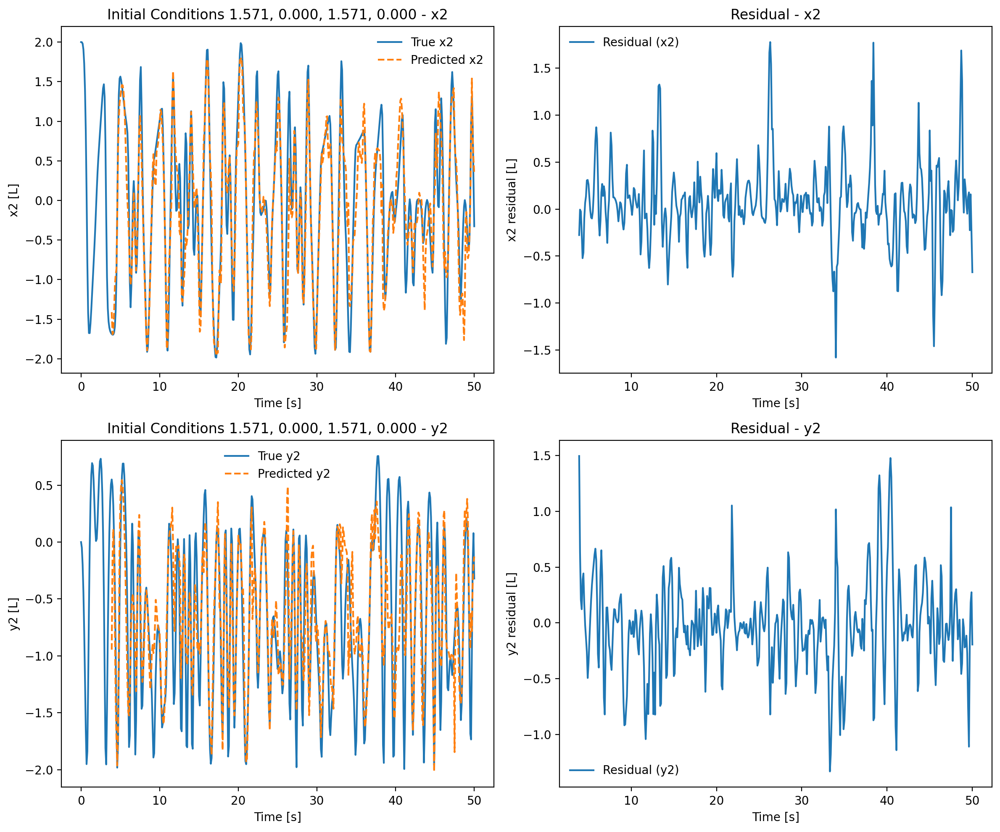

In [ ]:
# Plot true and predicted trajectories
plot_Predictions_m2(positions, positions_hat, windowsize, offset, t, z0)

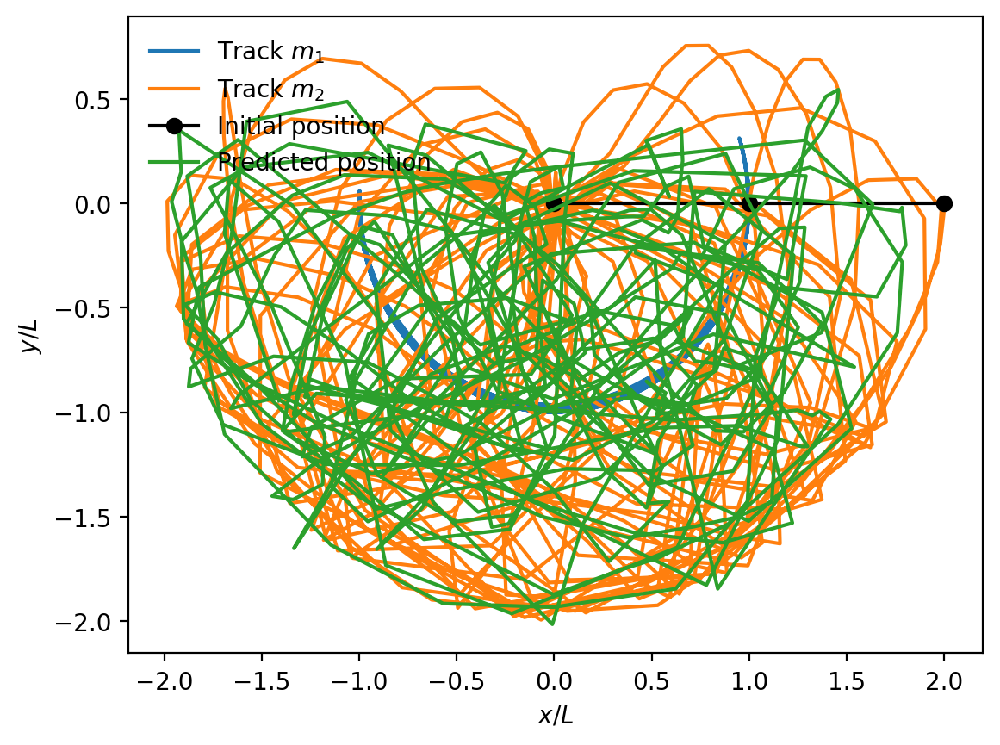

In [ ]:
fig,ax=plt.subplots()
ax.plot(x1, y1, label=r"Track $m_1$")
ax.plot(x2, y2, label=r"Track $m_2$")
ax.plot([0, x1[0], x2[0]], [0, y1[0], y2[0]], "-o", label="Initial position", c='k')
ax.plot(positions_hat[:,0], positions_hat[:,1], label="Predicted position")
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

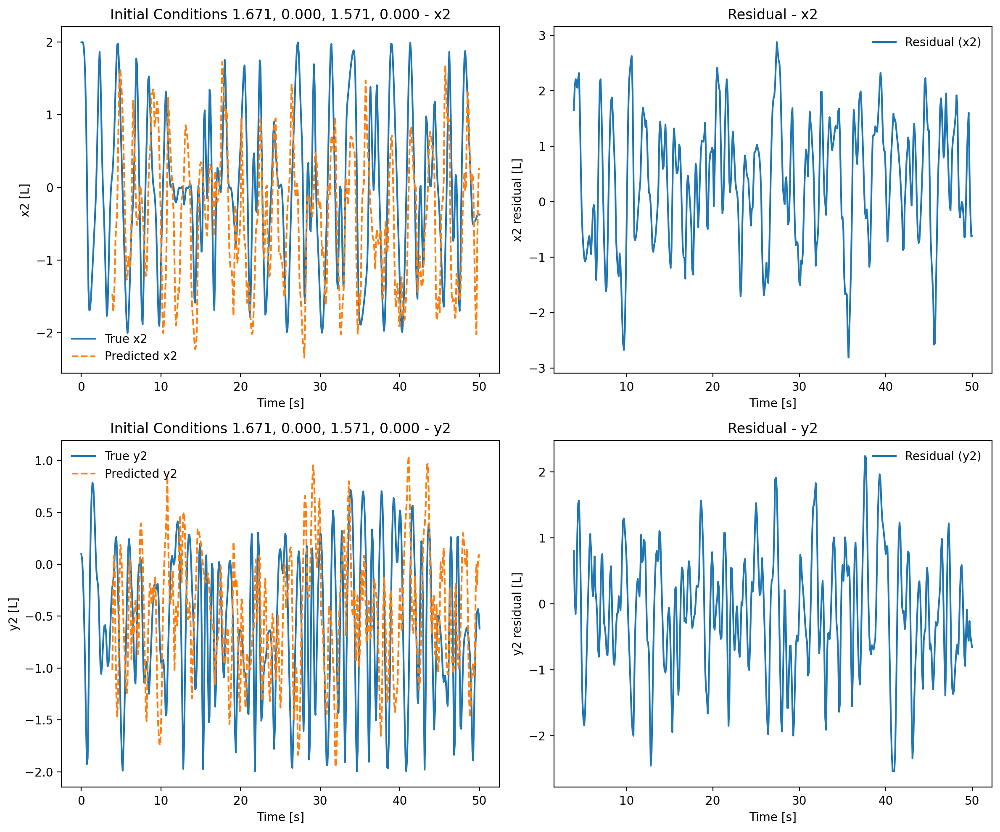

In [ ]:
# Introduce perturbed initial conditions
z0_perturbed = [np.pi/2 + 0.1, 0, np.pi/2, 0]

# Solve initial value problem
ret_pert = solve_ivp(rhs, (0,tmax), z0_perturbed, t_eval=t, args=(L1, L2, m1, m2, g))
z_pert=ret_pert.y

# Extract result
theta1_pert, w1_pert, theta2_pert, w2_pert = z_pert[0], z_pert[1], z_pert[2], z_pert[3]
x1_pert, y1_pert, x2_pert, y2_pert, vx1_pert, vy1_pert, vx2_pert, vy2_pert = to_cartesian(theta1_pert, w1_pert, theta2_pert, w2_pert, L1, L2)

positions_pert = np.stack([x2_pert, y2_pert], axis=1)

# Get our input and label arrays
positions_pertInput,positions_pertLabel = shapeArray(positions_pert,windowsize,offset)

# Calculate the predictions
positions_pert_hat = model.predict_on_batch(positions_pertInput)  # shape: (samples, 4)

# Plot true and predicted trajectories
plot_Predictions_m2(positions_pert, positions_pert_hat, windowsize, offset, t, z0_perturbed)

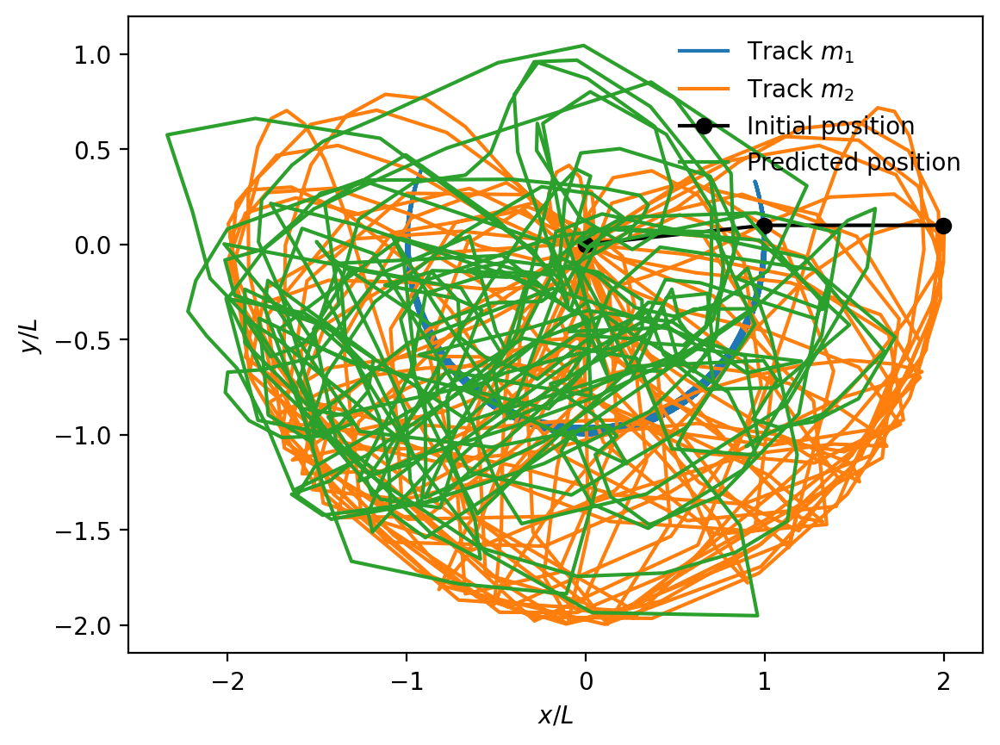

In [ ]:
fig,ax=plt.subplots()
ax.plot(x1_pert, y1_pert, label=r"Track $m_1$")
ax.plot(x2_pert, y2_pert, label=r"Track $m_2$")
ax.plot([0, x1_pert[0], x2_pert[0]], [0, y1_pert[0], y2_pert[0]], "-o", label="Initial position", c='k')
ax.plot(positions_pert_hat[:,0], positions_pert_hat[:,1], label="Predicted position")
plt.ylabel(r"$y/L$")
plt.xlabel(r"$x/L$")
ax.legend()

Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_62 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_63 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 251ms/step - accuracy: 0.4454 - loss: 0.8197 - val_accuracy: 0.8065 - val_loss: 0.7591
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.6863 - loss: 0.6805 - val_accuracy: 0.8065 - val_loss: 0.6847
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.6713 - loss: 0.6734 - val_accuracy: 0.8065 - val_loss: 0.6736
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6700 - loss: 0.6453 - val_accuracy: 0.8065 - val_loss: 0.6452
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6911 - loss: 0.6273 - val_accuracy: 0.7957 - val_loss: 0.6376
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.6797 - loss: 0.6297 - val_accuracy: 0.7419 - val_loss: 0.6420
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6999 - loss: 0.5964 - val_accuracy: 0.7312 - val_loss: 0.6428
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.6876 - loss: 0.5934 - val_accuracy: 0.7204 - val_loss

Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_64 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_65 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 239ms/step - accuracy: 0.4822 - loss: 0.9575 - val_accuracy: 0.7143 - val_loss: 0.6984
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.6744 - loss: 0.7350 - val_accuracy: 0.7143 - val_loss: 0.6190
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.7325 - loss: 0.6642 - val_accuracy: 0.7143 - val_loss: 0.6274
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - accuracy: 0.7088 - loss: 0.6475 - val_accuracy: 0.7143 - val_loss: 0.5704
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.6919 - loss: 0.6244 - val_accuracy: 0.7253 - val_loss: 0.5324
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.7156 - loss: 0.5865 - val_accuracy: 0.7473 - val_loss: 0.5117
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.7156 - loss: 0.5893 - val_accuracy: 0.7692 - val_loss: 0.4949
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6851 - loss: 0.5815 - val_accuracy: 0.7692 - val_loss

Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_66 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_67 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_33 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 5s 247ms/step - accuracy: 0.5248 - loss: 0.8602 - val_accuracy: 0.7079 - val_loss: 0.7607
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.7248 - loss: 0.6756 - val_accuracy: 0.7191 - val_loss: 0.6890
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.7092 - loss: 0.6565 - val_accuracy: 0.7191 - val_loss: 0.6733
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - accuracy: 0.7011 - loss: 0.6307 - val_accuracy: 0.7079 - val_loss: 0.6559
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.7086 - loss: 0.5809 - val_accuracy: 0.7528 - val_loss: 0.6608
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.7136 - loss: 0.5744 - val_accuracy: 0.7528 - val_loss: 0.6593
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.6685 - loss: 0.5768 - val_accuracy: 0.7528 - val_loss: 0.6542
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - accuracy: 0.7041 - loss: 0.5655 - val_accuracy: 0.7528 - val_loss

Model: "sequential_34"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_68 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_69 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_34 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - accuracy: 0.6163 - loss: 0.9001 - val_accuracy: 0.6552 - val_loss: 0.7029
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.7103 - loss: 0.7269 - val_accuracy: 0.7011 - val_loss: 0.5914
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - accuracy: 0.6798 - loss: 0.6728 - val_accuracy: 0.7011 - val_loss: 0.5881
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 117ms/step - accuracy: 0.6815 - loss: 0.6624 - val_accuracy: 0.6897 - val_loss: 0.5827
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - accuracy: 0.7305 - loss: 0.6317 - val_accuracy: 0.6322 - val_loss: 0.5974
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.7167 - loss: 0.6188 - val_accuracy: 0.6092 - val_loss: 0.6122
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.7177 - loss: 0.6104 - val_accuracy: 0.6092 - val_loss: 0.6112
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.6977 - loss: 0.6142 - val_accuracy: 0.6322 - val_lo

Model: "sequential_35"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_70 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_71 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_35 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 224ms/step - accuracy: 0.5955 - loss: 0.8423 - val_accuracy: 0.6353 - val_loss: 0.7122
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - accuracy: 0.7062 - loss: 0.6664 - val_accuracy: 0.6588 - val_loss: 0.7191
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.6999 - loss: 0.6263 - val_accuracy: 0.6235 - val_loss: 0.6799
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.7219 - loss: 0.6184 - val_accuracy: 0.6235 - val_loss: 0.6641
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.6830 - loss: 0.6159 - val_accuracy: 0.5765 - val_loss: 0.6586
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - accuracy: 0.6439 - loss: 0.5988 - val_accuracy: 0.5412 - val_loss: 0.6516
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - accuracy: 0.6547 - loss: 0.6118 - val_accuracy: 0.5529 - val_loss: 0.6449
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.6559 - loss: 0.6043 - val_accuracy: 0.6118 - val_loss

Model: "sequential_36"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_72 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_73 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_36 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - accuracy: 0.4500 - loss: 0.8986 - val_accuracy: 0.7349 - val_loss: 0.7272
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - accuracy: 0.6797 - loss: 0.7545 - val_accuracy: 0.7349 - val_loss: 0.6325
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.6694 - loss: 0.6925 - val_accuracy: 0.7349 - val_loss: 0.6415
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.6704 - loss: 0.6889 - val_accuracy: 0.7229 - val_loss: 0.6158
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.6982 - loss: 0.6487 - val_accuracy: 0.6747 - val_loss: 0.6045
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - accuracy: 0.6404 - loss: 0.6538 - val_accuracy: 0.6265 - val_loss: 0.6038
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6604 - loss: 0.6546 - val_accuracy: 0.6506 - val_loss: 0.6052
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6791 - loss: 0.6309 - val_accuracy: 0.6747 - val_loss

Model: "sequential_37"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_74 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_75 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_37 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 324ms/step - accuracy: 0.4504 - loss: 0.9154 - val_accuracy: 0.6914 - val_loss: 0.7540
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - accuracy: 0.7117 - loss: 0.7681 - val_accuracy: 0.6914 - val_loss: 0.6833
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.7179 - loss: 0.7067 - val_accuracy: 0.6914 - val_loss: 0.6912
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - accuracy: 0.7058 - loss: 0.7093 - val_accuracy: 0.6790 - val_loss: 0.6803
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.7321 - loss: 0.6839 - val_accuracy: 0.6790 - val_loss: 0.6764
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.7046 - loss: 0.6656 - val_accuracy: 0.6790 - val_loss: 0.6779
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - accuracy: 0.7058 - loss: 0.6582 - val_accuracy: 0.6790 - val_loss: 0.6742
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.7108 - loss: 0.6447 - val_accuracy: 0.6790 - val_loss

Model: "sequential_38"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_76 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_77 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_38 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 241ms/step - accuracy: 0.5128 - loss: 0.8949 - val_accuracy: 0.6582 - val_loss: 0.7025
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.6608 - loss: 0.7048 - val_accuracy: 0.6582 - val_loss: 0.6625
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.6524 - loss: 0.6783 - val_accuracy: 0.6709 - val_loss: 0.6772
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6733 - loss: 0.6605 - val_accuracy: 0.6835 - val_loss: 0.6421
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.6876 - loss: 0.6500 - val_accuracy: 0.6835 - val_loss: 0.6351
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.6939 - loss: 0.6670 - val_accuracy: 0.6835 - val_loss: 0.6335
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - accuracy: 0.6626 - loss: 0.6288 - val_accuracy: 0.6835 - val_loss: 0.6291
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.6676 - loss: 0.6341 - val_accuracy: 0.6835 - val_loss

Model: "sequential_39"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_78 (LSTM)                       │ (None, None, 100)           │          41,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_79 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_39 (Dense)                     │ (None, 2)                   │             102 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 71,502 (279.30 KB)

 Trainable params: 71,502 (279.30 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 229ms/step - accuracy: 0.5723 - loss: 0.9218 - val_accuracy: 0.7013 - val_loss: 0.6843
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.6846 - loss: 0.7695 - val_accuracy: 0.7013 - val_loss: 0.6177
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - accuracy: 0.6827 - loss: 0.6779 - val_accuracy: 0.7013 - val_loss: 0.6629
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - accuracy: 0.7002 - loss: 0.7045 - val_accuracy: 0.7013 - val_loss: 0.6440
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.6683 - loss: 0.6683 - val_accuracy: 0.6883 - val_loss: 0.6285
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - accuracy: 0.6421 - loss: 0.6307 - val_accuracy: 0.6883 - val_loss: 0.6344
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step - accuracy: 0.6605 - loss: 0.6253 - val_accuracy: 0.6883 - val_loss: 0.6317
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - accuracy: 0.6443 - loss: 0.6495 - val_accuracy: 0.6883 - val_loss

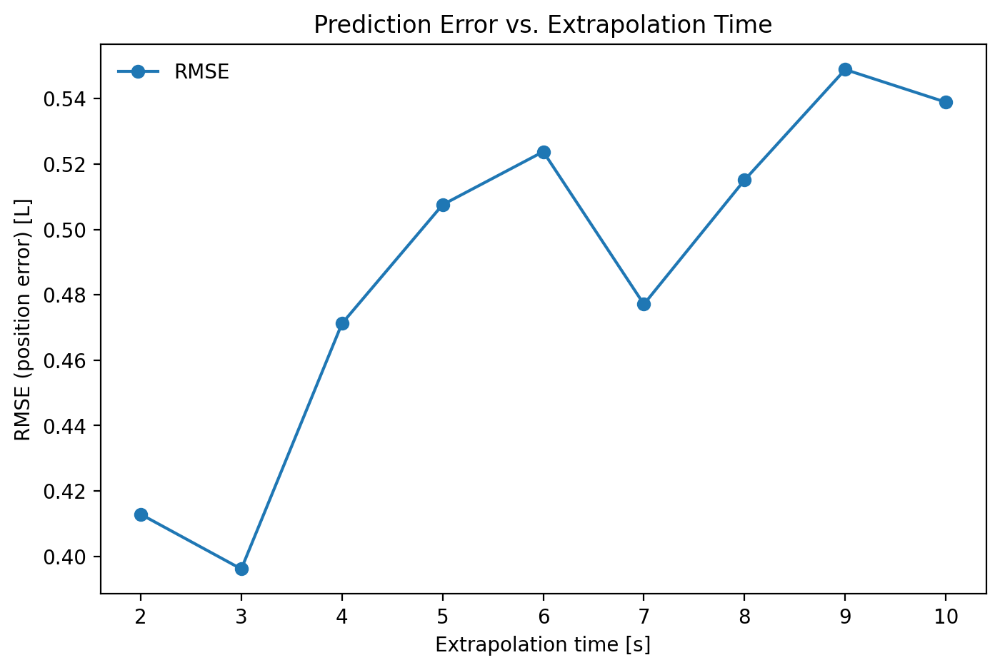

In [ ]:
# Compute the deviation between true and predicted trajectories for different offset values
offset_Deviation_m2(positions)

The original network trained with both masses and with initial conditions $z_0 = [\frac{\pi}{4}, 0, \frac{\pi}{4}, 0]$ performed well, particularly on the $x_1$ and $x_2$ positions. Residuals rarely exceeded 0.1 for each component and the root mean squared error was low for an offset value of 20 compared to later models. Although the RMSE was low for all offset values tested between 20 and 100, it was odd to see that some higher offset values performed better than lower offset values, implying the model became more accurate when predicting further into the future. This may reflect the fact that at 40 & 70 time steps ahead, the network may have learnt to 'average out' some of the more chaotic deviations and this could lead to a lower RMSE value. For the perturbed values, $z_0 = [\frac{\pi}{4} + 0.1, 0, \frac{\pi}{4}, 0]$, the difference between the true values and the predicted values was much larger, with some residuals reaching values of 0.6. This reflects the chaotic nature of the double pendulum and that even small changes to the initial conditions can drastically impact the system in the long term.

When the initial conditions were changed to $z_0 = [\frac{\pi}{2}, 0, \frac{\pi}{2}, 0]$, the residuals reached absolute values of 1.5 and the perturbed conditions $z_0 = [\frac{\pi}{2} + 0.1, 0, \frac{\pi}{2}, 0]$ produced some residuals that exceeded values of 3.0. This time, the plot of the RMSE showed a much more intuitive result where there was a general upward trend in error for larger offset values, showing that the chaotic system is difficult to predict far into the future.

Finally, the network trained on just the second mass performed fairly similarly to when it was trained on both masses when the intial conditions were $z_0 = [\frac{\pi}{4}, 0, \frac{\pi}{4}, 0]$ and $z_0 = [\frac{\pi}{4} + 0.1, 0, \frac{\pi}{4}, 0]$. The RMSE values were only slightly higher than when both masses were used in training and this most likely reflects the fact that at these initial conditions, the double pendulum still follows a fairly periodic trajectory, so even without the first mass, the network can predict what the system will do in the future. However, yet again when the larger initial conditions $z_0 = [\frac{\pi}{2}, 0, \frac{\pi}{2}, 0]$ and $z_0 = [\frac{\pi}{2} + 0.1, 0, \frac{\pi}{2}, 0]$ were introduced, the chaotic nature of the system makes it difficult to predict. The network had a very hard time predicting what the trajectory would look like when only trained on the second mass, and so the RMSE was also much larger than the previous scenarios.